In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")
import numpy as np
import scanpy.api as sc
from anndata import read_h5ad
from anndata import AnnData
import scipy as sp
import scipy.stats
from gprofiler import GProfiler
from gprofiler_plotting import plot_enrich
import pickle
from sklearn.neighbors import KNeighborsClassifier
from adjustText import adjust_text
# Other specific functions 
from itertools import product
from statsmodels.stats.multitest import multipletests
import martin_helper as mh
# R related packages 
import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import anndata2ri

/home/martin/anaconda3/lib/python3.6/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [2]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython
# autoreload
%load_ext autoreload
%autoreload 2
# logging
sc.logging.print_versions()

scanpy==1.4.3 anndata==0.6.20 umap==0.3.8 numpy==1.16.4 scipy==1.2.1 pandas==0.25.0 scikit-learn==0.21.1 statsmodels==0.9.0 python-igraph==0.7.1 louvain==0.6.1 


## Load data

In [7]:
# maca_local = '/data/maca_local' 
maca_local = '/data3/martin/maca_local'
output_folder = '/home/martin/maca/maca-data-analysis/results/fig_cluster'

In [4]:
# Load the data 
adata_combine = mh.load_normalized_data(maca_local, log1p=True)

In [5]:
temp_facs = adata_combine[adata_combine.obs['b_method']=='facs',]
temp_droplet = adata_combine[adata_combine.obs['b_method']=='droplet',]

### Load clustering result

In [6]:
# Load DE result
temp_output_folder = '/data3/martin/maca_local/result/cluster_tissue_celltype'
with open(temp_output_folder+'/cluster_mouse_tissue_03.pickle', 'rb') as handle:
    dic_data_03 = pickle.load(handle)
with open(temp_output_folder+'/cluster_mouse_tissue_05.pickle', 'rb') as handle:
    dic_data_05 = pickle.load(handle)
with open(temp_output_folder+'/cluster_mouse_tissue_07.pickle', 'rb') as handle:
    dic_data_07 = pickle.load(handle)

### Setup annotation list

In [8]:
analysis_list = list(dic_data_05.keys())
method_tissue_list = list(set([x.split('.')[0] + '.' + x.split('.')[2]
                               for x in analysis_list]))
method_tissue_list.sort()
mouse_list = list(set([x.split('.')[1] for x in analysis_list]))
mouse_list.sort()

In [9]:
method_tissue_celltype_list = []
for analyte in method_tissue_list:
    method,tissue = analyte.split('.')
    ind_select = (adata_combine.obs['tissue'] == tissue) & \
                        (adata_combine.obs['b_method'] == method)
    temp_cell_type_list = set(adata_combine.obs['cell_ontology_class'][ind_select])
    method_tissue_celltype_list = method_tissue_celltype_list + \
                                    ['%s.%s.%s'%(method, tissue, x) for x in 
                                     list(temp_cell_type_list)]
method_tissue_celltype_list.sort()

In [10]:
# mice annotation
import re
df_annotation = pd.DataFrame(index=mouse_list)
df_annotation['age'] = ['%sm'%re.split('_|-', x)[0] for x in df_annotation.index]
df_annotation['age_num'] = [int(re.split('_|-', x)[0]) for x in df_annotation.index]
df_annotation['sex'] = ['male' if 'M' in x else 'female' for x in df_annotation.index]
# A sorted agelist
age_list = list(set(df_annotation['age_num']))
age_list.sort()
age_list = ['%sm'%x for x in age_list]

### Diversity score

In [11]:
# compute divergence score for each tissue or each tissue-celltype
cluster_method_list = ['03.louvain', '03.leiden', 
                       '05.louvain', '05.leiden',
                       '07.louvain', '07.leiden']
# divergence for each tissue
dic_div_tissue = {x:pd.DataFrame(index = mouse_list, columns=method_tissue_list, data=-1)
                  for x in cluster_method_list}
# divergence for each tissue-celltype
dic_div_tc = {x:pd.DataFrame(index = mouse_list, 
                             columns=method_tissue_celltype_list, data=-1)
              for x in cluster_method_list}
for analyte_cluster in cluster_method_list:
    if analyte_cluster.split('.')[0] == '03':
        temp_dic_data = dic_data_03.copy()
    elif analyte_cluster.split('.')[0] == '05':
        temp_dic_data = dic_data_05.copy()
    elif analyte_cluster.split('.')[0] == '07':
        temp_dic_data = dic_data_07.copy()
    else:
        print('no data')
        continue
    for analyte in analysis_list:
        method,mouse_id,tissue = analyte.split('.')
        temp_adata = temp_dic_data[analyte]
        cluster_method = analyte_cluster.split('.')[1]
        # Tissue level diversity calculation
        pk = np.array(temp_adata.obs[cluster_method], dtype=int)
        pk = np.bincount(pk)
        temp_str = '%s.%s'%(method,tissue)
        dic_div_tissue[analyte_cluster].loc[mouse_id, temp_str] = sp.stats.entropy(pk)
        # Tissue.cell_type level calculation
        for cell_type in set(temp_adata.obs['cell_ontology_class']):
            ind_select = (temp_adata.obs['cell_ontology_class']==cell_type)
            if np.sum(ind_select)<25:
#                 print(cell_type, np.sum(ind_select))
                continue
            temp_temp_adata = temp_adata[ind_select]
            pk = np.array(temp_temp_adata.obs[cluster_method], dtype=int)
            pk = np.bincount(pk)
            temp_str = '%s.%s.%s'%(method,tissue,cell_type)
            dic_div_tc[analyte_cluster].loc[mouse_id, temp_str] = sp.stats.entropy(pk)

### p-value

In [12]:
# assign a p-value by LR 
from statsmodels.stats.multitest import multipletests
df_analysis_tissue = pd.DataFrame(index=method_tissue_list)
df_analysis_tc = pd.DataFrame(index=method_tissue_celltype_list)
for analyte_cluster in cluster_method_list:
    df_analysis_tissue['%s.raw_p'%analyte_cluster] = -1
    df_analysis_tissue['%s.bh_p'%analyte_cluster] = -1
    df_analysis_tissue['%s.slope'%analyte_cluster] = -1
    df_analysis_tissue['%s.r_square'%analyte_cluster] = -1
    for age in age_list:
        df_analysis_tissue['%s.%s'%(analyte_cluster, age)] = -1
    # tissue level 
    temp_df_div = dic_div_tissue[analyte_cluster].copy()
    temp_analysis_list = temp_df_div.columns
    temp_df_div = temp_df_div.join(df_annotation)
    for analyte in temp_analysis_list:
        temp_df_LR = temp_df_div[[analyte, 'age_num']]
        temp_df_LR = temp_df_LR.loc[temp_df_LR[analyte]>-1]
        if temp_df_LR.shape[0]<5: continue
        sl, icpt, r_val, p_val, _ = sp.stats.linregress(temp_df_LR['age_num'],
                                                        temp_df_LR[analyte])
        df_analysis_tissue.loc[analyte, '%s.raw_p'%analyte_cluster] = p_val
        df_analysis_tissue.loc[analyte, '%s.slope'%analyte_cluster] = sl
        df_analysis_tissue.loc[analyte, '%s.r_square'%analyte_cluster] = r_val**2
        # add mean diversity for each age
        for age in age_list:
            ind_select = (temp_df_div['age']==age) & (temp_df_div[analyte]>-1)
            if np.sum(ind_select)==0:
                continue
            df_analysis_tissue.loc[analyte, '%s.%s'%(analyte_cluster, age)] = \
                np.mean(temp_df_div.loc[ind_select, analyte])    
    ## bh-p value
    temp_df = df_analysis_tissue[['%s.raw_p'%analyte_cluster]]
    temp_df = temp_df.loc[temp_df['%s.raw_p'%analyte_cluster]>-1]
    res_bh = multipletests(temp_df['%s.raw_p'%analyte_cluster], alpha=0.2, method='fdr_bh')
    temp_df['%s.bh_p'%analyte_cluster] = res_bh[1]
    df_analysis_tissue.loc[temp_df.index, 
                           '%s.bh_p'%analyte_cluster] = temp_df['%s.bh_p'%analyte_cluster]
    # tc level
    df_analysis_tc['%s.raw_p'%analyte_cluster] = -1
    df_analysis_tc['%s.bh_p'%analyte_cluster] = -1
    df_analysis_tc['%s.slope'%analyte_cluster] = -1
    df_analysis_tc['%s.r_square'%analyte_cluster] = -1
    for age in age_list:
        df_analysis_tc['%s.%s'%(analyte_cluster, age)] = -1
    temp_df_div = dic_div_tc[analyte_cluster].copy()
    temp_analysis_list = temp_df_div.columns
    temp_df_div = temp_df_div.join(df_annotation)
    for analyte in temp_analysis_list:
        temp_df_LR = temp_df_div[[analyte, 'age_num']]
        temp_df_LR = temp_df_LR.loc[temp_df_LR[analyte]>-1]
        if temp_df_LR.shape[0]<8: continue
        sl, icpt, r_val, p_val, _ = sp.stats.linregress(temp_df_LR['age_num'],
                                                        temp_df_LR[analyte])
        df_analysis_tc.loc[analyte, '%s.raw_p'%analyte_cluster] = p_val
        df_analysis_tc.loc[analyte, '%s.slope'%analyte_cluster] = sl
        df_analysis_tc.loc[analyte, '%s.r_square'%analyte_cluster] = r_val**2
        # add mean diversity for each age
        for age in age_list:
            ind_select = (temp_df_div['age']==age) & (temp_df_div[analyte]>-1)
            if np.sum(ind_select)==0:
                continue
            df_analysis_tc.loc[analyte, '%s.%s'%(analyte_cluster, age)] = \
                np.mean(temp_df_div.loc[ind_select, analyte])   
    ## bh-p value
    temp_df = df_analysis_tc[['%s.raw_p'%analyte_cluster]]
    temp_df = temp_df.loc[temp_df['%s.raw_p'%analyte_cluster]>-1]
    res_bh = multipletests(temp_df['%s.raw_p'%analyte_cluster], alpha=0.2, method='fdr_bh')
    temp_df['%s.bh_p'%analyte_cluster] = res_bh[1]
    df_analysis_tc.loc[temp_df.index, 
                       '%s.bh_p'%analyte_cluster] = temp_df['%s.bh_p'%analyte_cluster]

### Compare the concordance between the 6 clustering configurations

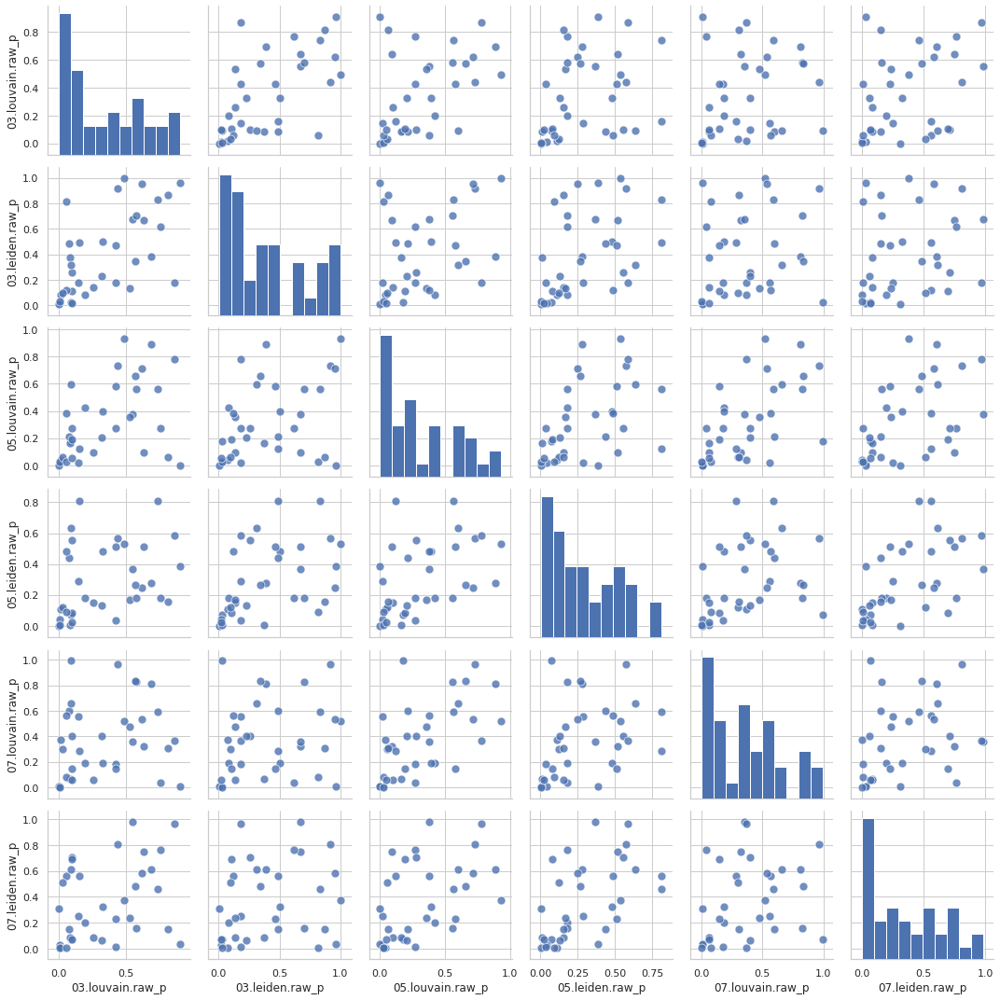

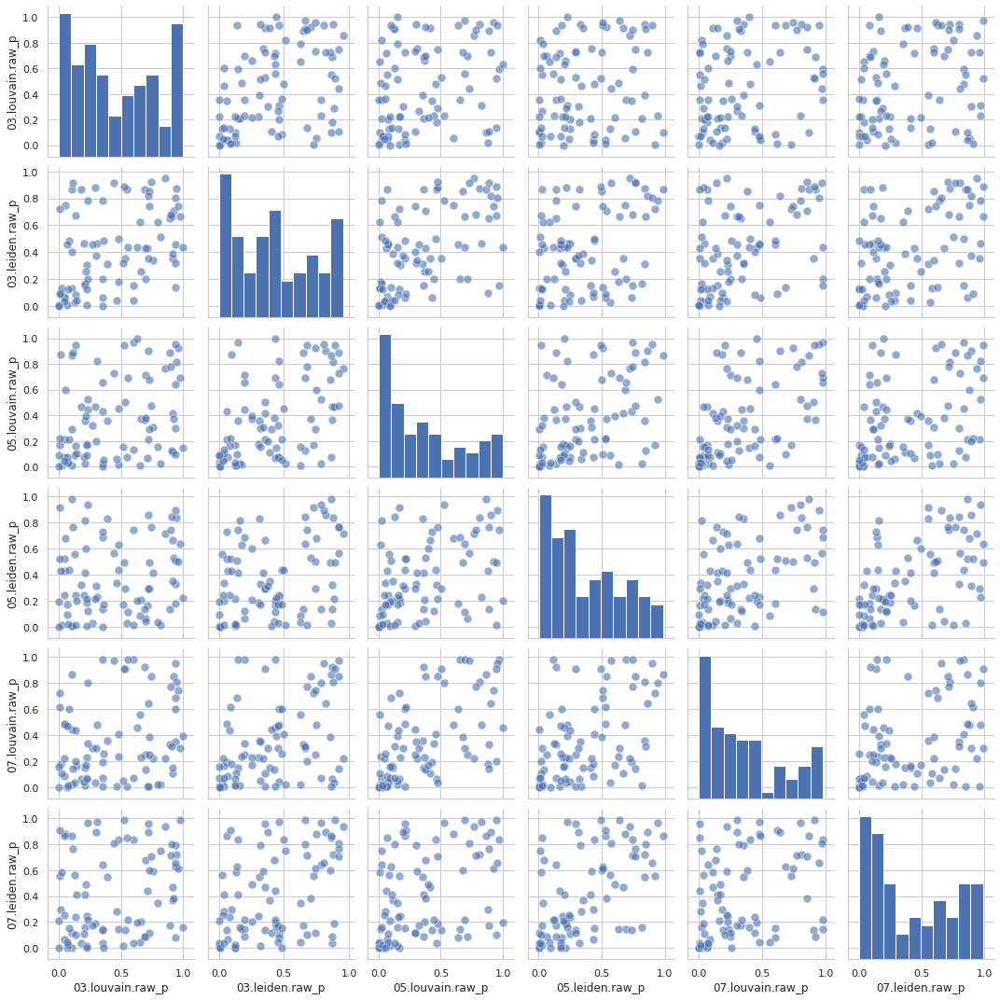

In [17]:
# Tissue level concordance: raw p-value
ind_select = df_analysis_tissue.mean(axis=1)>-1
sns.pairplot(data=df_analysis_tissue.loc
             [ind_select, ['03.louvain.raw_p', '03.leiden.raw_p',
                           '05.louvain.raw_p', '05.leiden.raw_p',
                           '07.louvain.raw_p', '07.leiden.raw_p']],
             kind='scatter', plot_kws={"s": 80, 'alpha':0.8})
plt.tight_layout()
plt.savefig(output_folder + '/concordance_tissue_rawp.pdf')
plt.show()
# Tissue-celltype level concordance: raw p-value
ind_select = df_analysis_tc.mean(axis=1)>-1
sns.pairplot(data=df_analysis_tc.loc
             [ind_select, ['03.louvain.raw_p', '03.leiden.raw_p',
                           '05.louvain.raw_p', '05.leiden.raw_p',
                           '07.louvain.raw_p', '07.leiden.raw_p']],
             kind='scatter', plot_kws={"s": 80, 'alpha':0.6})
plt.tight_layout()
plt.savefig(output_folder + '/concordance_tc_rawp.pdf')
plt.show()

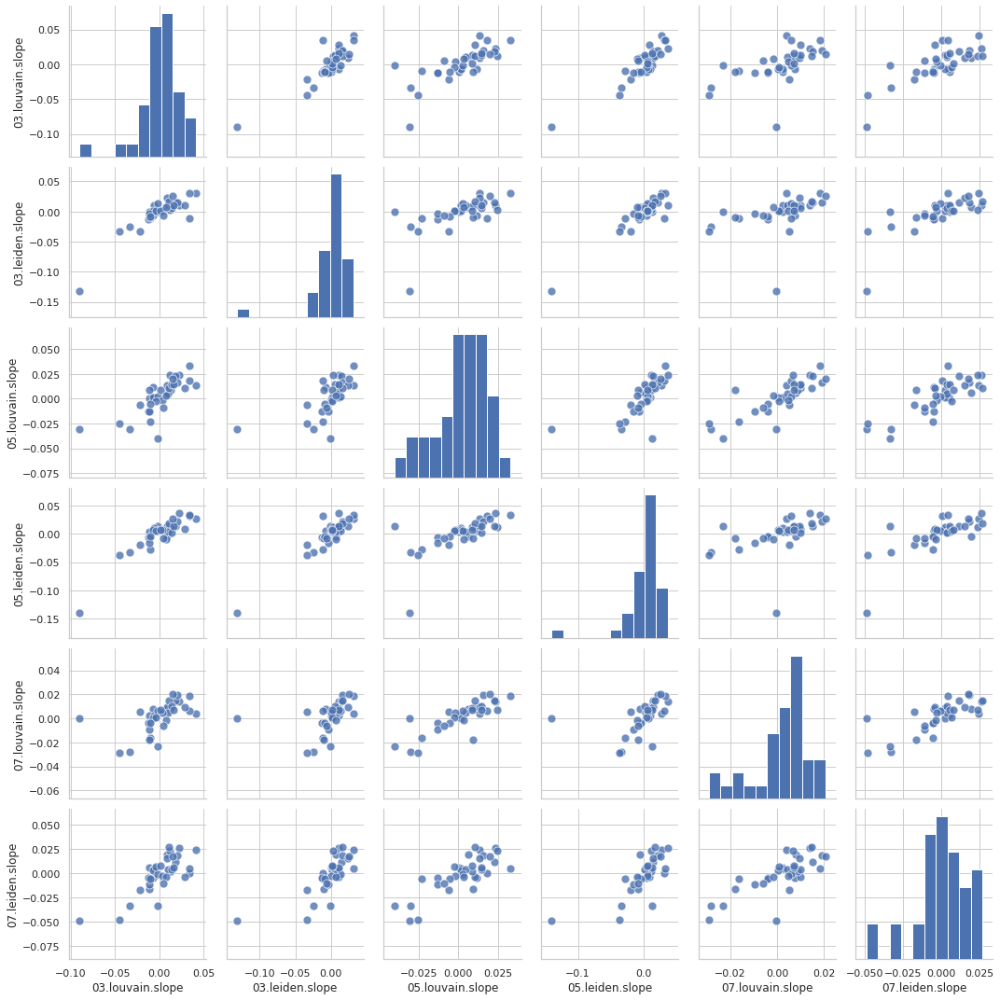

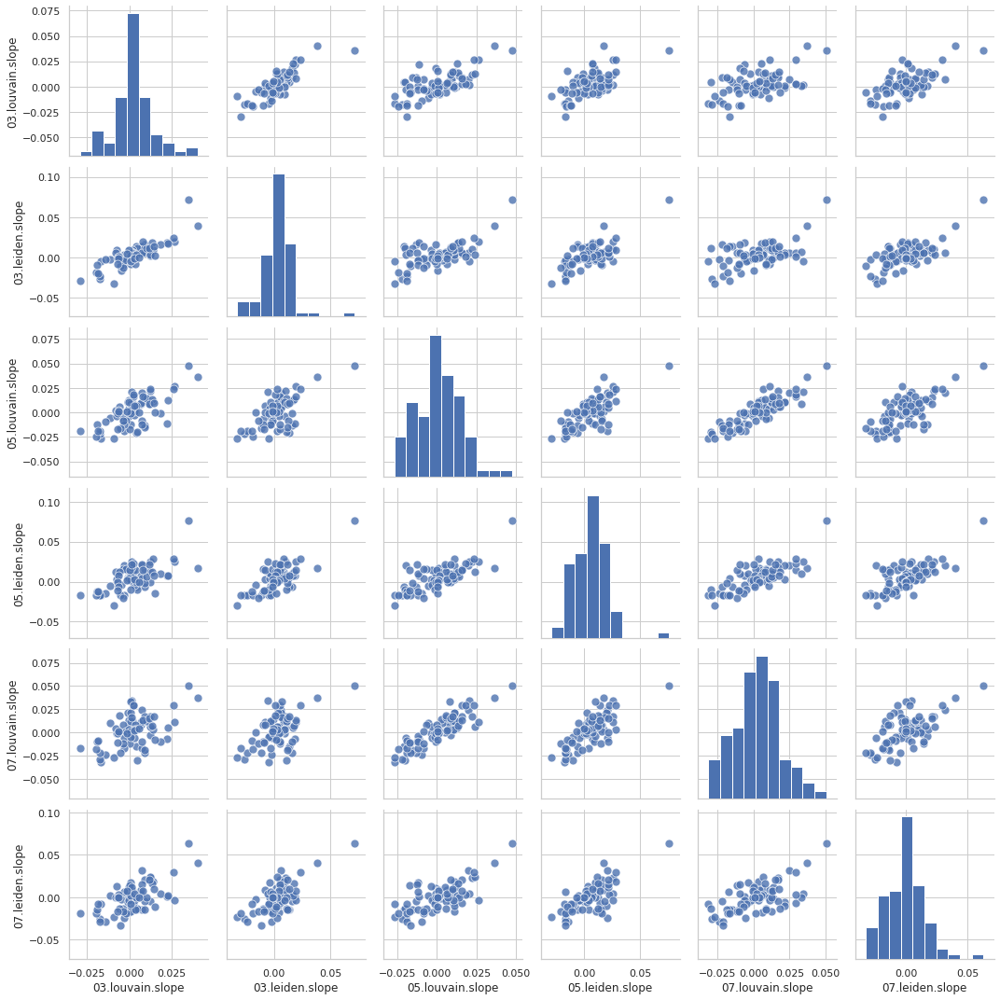

In [18]:
# Tissue level concordance: slope
ind_select = df_analysis_tissue.mean(axis=1)>-1
sns.pairplot(data=df_analysis_tissue.loc
             [ind_select, ['03.louvain.slope', '03.leiden.slope',
                           '05.louvain.slope', '05.leiden.slope',
                           '07.louvain.slope', '07.leiden.slope']],
             kind='scatter', plot_kws={"s": 80, 'alpha':0.8})
plt.tight_layout()
plt.savefig(output_folder + '/concordance_tissue_slope.pdf')
plt.show()
# Tissue cell-type level concordance: slope
ind_select = df_analysis_tc.mean(axis=1)>-1
sns.pairplot(data=df_analysis_tc.loc
             [ind_select, ['03.louvain.slope', '03.leiden.slope',
                           '05.louvain.slope', '05.leiden.slope',
                           '07.louvain.slope', '07.leiden.slope']],
             kind='scatter', plot_kws={"s": 80, 'alpha':0.8})
plt.tight_layout()
plt.savefig(output_folder + '/concordance_tc_slope.pdf')
plt.show()

### Selection

In [90]:
def assign_star(x):
    if (x<0.05):
        return '***'
    elif (x<0.1):
        return '**'
    elif (x<0.2):
        return '*'
    else:
        return ''

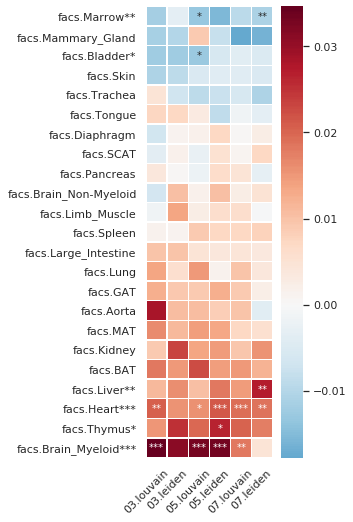

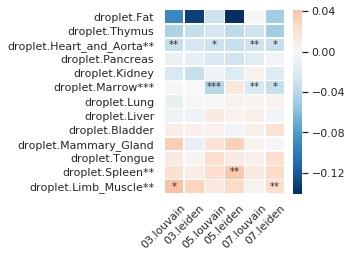

In [91]:
for method in ['facs', 'droplet']:
    # Heatmap for all tissues
    ind_select = df_analysis_tissue.mean(axis=1)>-1
    temp_df = df_analysis_tissue.loc[ind_select]
    ind_select = np.array([x.split('.')[0]==method for x in temp_df.index])
    ind_select = ind_select & np.array(['nan' not in x for x in temp_df.index])
    temp_df = temp_df.loc[ind_select]
    bh_p_list = ['%s.bh_p'%x for x in cluster_method_list]
    slope_list = ['%s.slope'%x for x in cluster_method_list]
    # Heatmap
    plot_df = temp_df[slope_list+bh_p_list]
    ind_sort = np.argsort(plot_df[slope_list].mean(axis=1))
    plot_df = plot_df.iloc[ind_sort]
    # Add star to index 
    temp_index = []
    for i_analyte,analyte in enumerate(plot_df.index):
        if (plot_df.loc[analyte, bh_p_list]<0.05).sum()>=1:
            temp_index.append(analyte + '***')
        elif (plot_df.loc[analyte, bh_p_list]<0.1).sum()>=1:
            temp_index.append(analyte + '**')
        elif (plot_df.loc[analyte, bh_p_list]<0.2).sum()>=1:
            temp_index.append(analyte + '*')
        else:
            temp_index.append(analyte)
    plot_df.index = temp_index
    # Convert bh_p_list to star_list
    star_list = ['%s.star'%x for x in cluster_method_list]
    for cluster_method in cluster_method_list:
        plot_df['%s.star'%cluster_method] = [assign_star(x)
                                             for x in plot_df['%s.bh_p'%cluster_method]]
    # add marker for significant ones
    plt.figure(figsize=[5,int(temp_df.shape[0]*0.35)])
    sns.heatmap(plot_df[slope_list], cmap = 'RdBu_r', center=0,
                annot=plot_df[star_list], fmt="s", linewidths=.5)
    plt.xticks(np.arange(len(slope_list)), [x.replace('.slope', '') for x in slope_list],
               rotation=45)
    plt.tight_layout(rect=[0, 0.03, 0.95, 0.95])
    plt.savefig(output_folder + '/selection_tissue_%s_full.pdf'%method)
    plt.show()

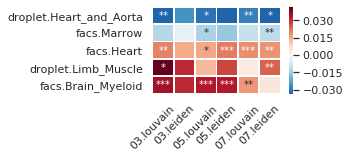

In [92]:
# Identify interesting cases for tissue
ind_select = df_analysis_tissue.mean(axis=1)>-1
temp_df = df_analysis_tissue.loc[ind_select]
bh_p_list = ['%s.bh_p'%x for x in cluster_method_list]
slope_list = ['%s.slope'%x for x in cluster_method_list]
# 1. at least 2 configurations have bh-p<0.2
# 2. direction of diversity change should be same
ind_select = (temp_df[bh_p_list]<0.2).sum(axis=1)>=2
n_up = (temp_df[slope_list]>0).sum(axis=1)
ind_select = ind_select & (n_up.isin([0,6])) 
ind_select = ind_select & np.array(['nan' not in x for x in temp_df.index])
temp_df = temp_df.loc[ind_select]
# record interesting cases
interesting_case_tissue = list(temp_df.index)
# Heatmap
plot_df = temp_df[slope_list+bh_p_list]
ind_sort = np.argsort(plot_df[slope_list].mean(axis=1))
plot_df = plot_df.iloc[ind_sort]
# Convert bh_p_list to star_list
star_list = ['%s.star'%x for x in cluster_method_list]
for cluster_method in cluster_method_list:
    plot_df['%s.star'%cluster_method] = [assign_star(x)
                                         for x in plot_df['%s.bh_p'%cluster_method]]
# plot_df[] = -np.log10(plot_df)
plt.figure(figsize=[5,2.5])
sns.heatmap(plot_df[slope_list], cmap = 'RdBu_r', center=0,
            annot=plot_df[star_list], fmt="s", linewidths=.5)
plt.xticks(np.arange(len(slope_list)), [x.replace('.slope', '') for x in slope_list],
           rotation=45)
plt.tight_layout(rect=[0, 0.03, 0.95, 0.95])
plt.savefig(output_folder + '/selection_tissue_significant.pdf')
plt.show()

droplet.Heart_and_Aorta


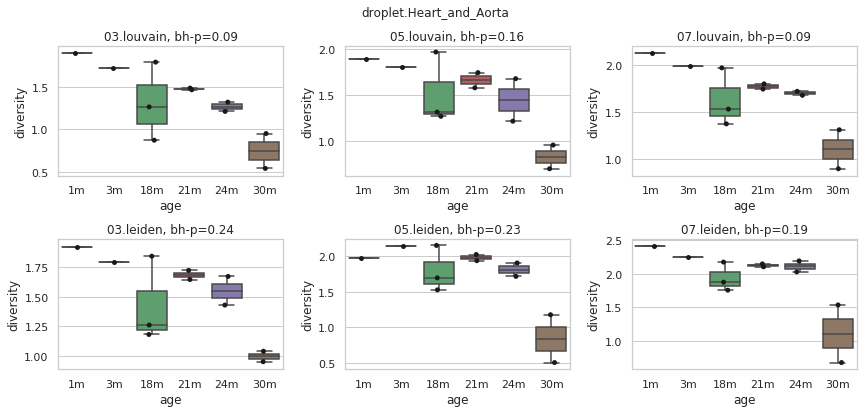

droplet.Limb_Muscle


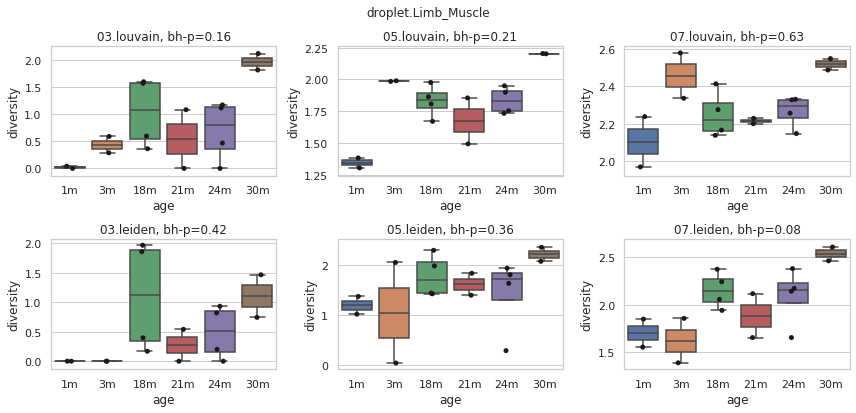

facs.Brain_Myeloid


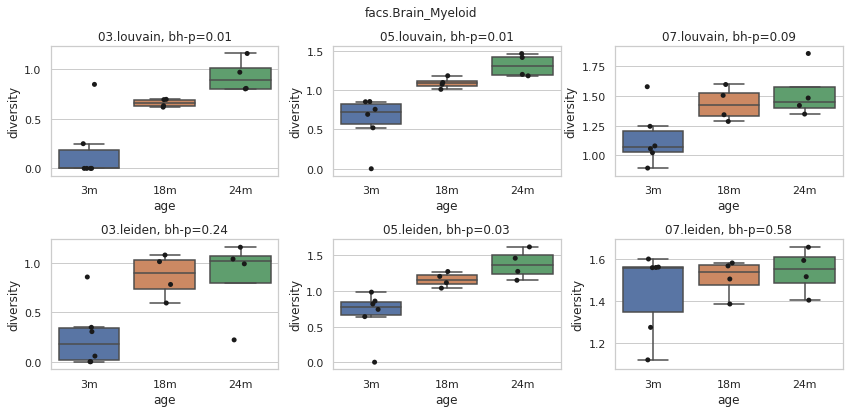

facs.Heart


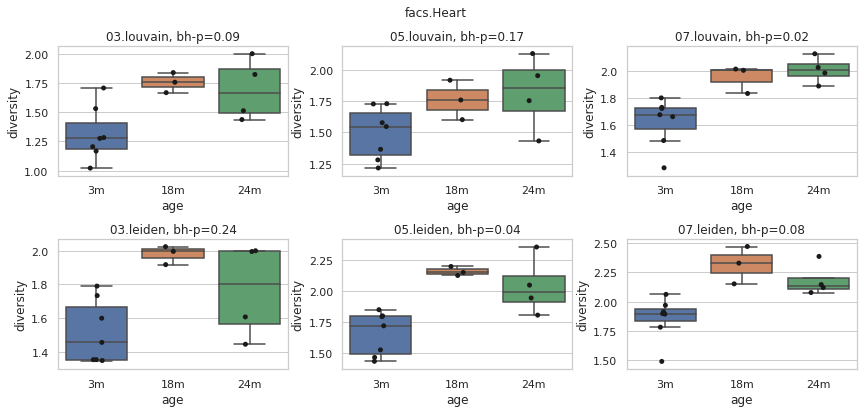

facs.Marrow


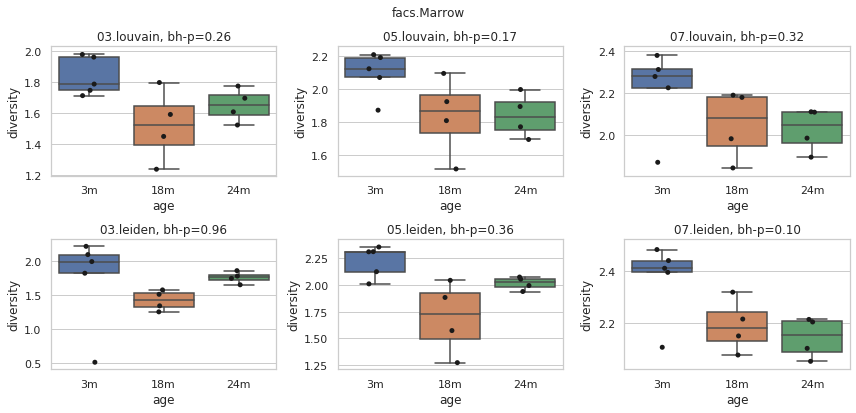

In [93]:
temp_cluster_method_list = ['03.louvain', '05.louvain', '07.louvain',
                            '03.leiden', '05.leiden', '07.leiden']
for analyte in temp_df.index:
    plt.figure(figsize=[12,6])
    i_pic = 0
    print(analyte)
    for cluster_method in temp_cluster_method_list:
        i_pic += 1
        plt.subplot(2,3,i_pic)
        temp_div = dic_div_tissue[cluster_method].copy()
        temp_div = temp_div.join(df_annotation)
        temp_div = temp_div.loc[temp_div[analyte]>-1,[analyte, 'age']]
        # sorted age_list
        age_list = [int(x[:-1]) for x in list(set(temp_div['age']))]
        age_list.sort()
        age_list = ['%dm'%x for x in age_list]
        # plot figures
        sns.stripplot(y=analyte, x='age', data=temp_div,
                      order = age_list, color='k')
        sns.boxplot(y=analyte, x='age', data=temp_div,
                      order = age_list, fliersize=0)
        plt.ylabel('diversity')
        plt.title('%s, bh-p=%0.2f'%(cluster_method, temp_df.loc[analyte, '%s.bh_p'%cluster_method]))
#     plt.tight_layout()
    plt.suptitle(analyte)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig(output_folder + '/diversity_%s.pdf'%analyte)
    plt.show()
#     break

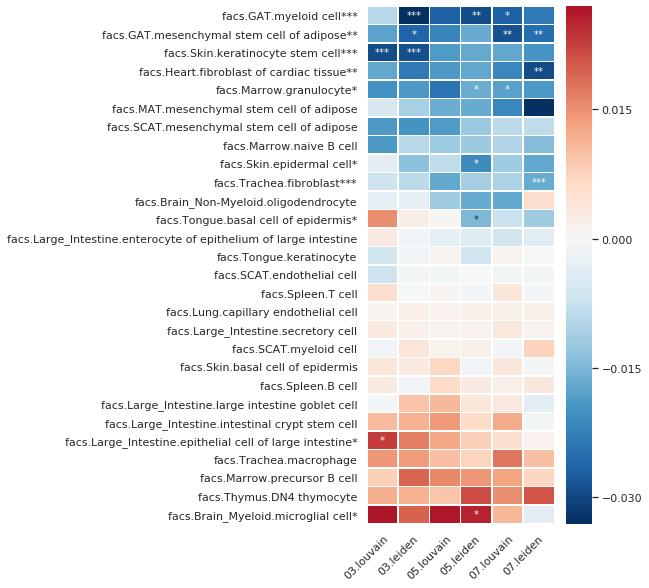

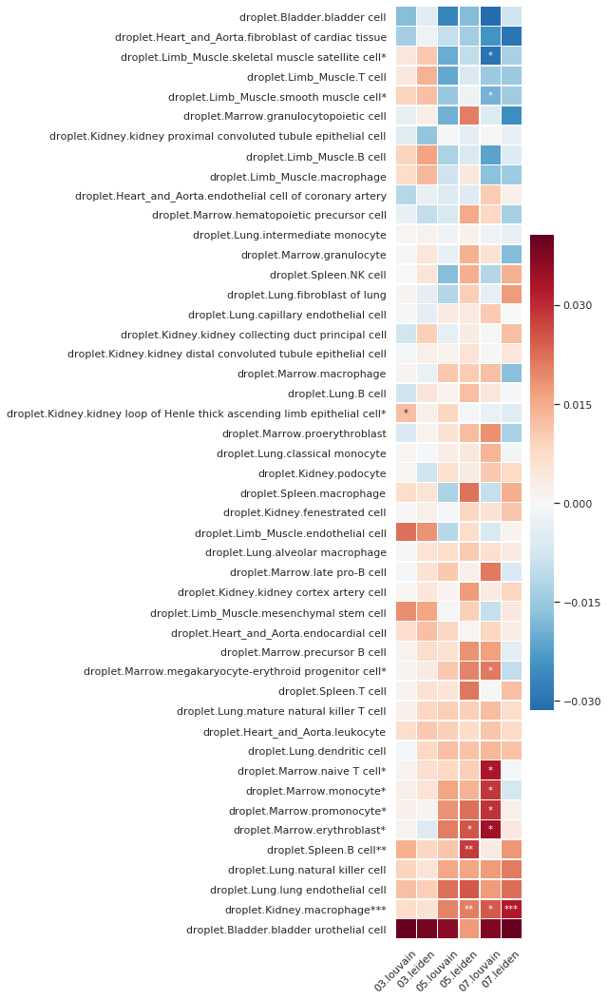

In [94]:
for method in ['facs', 'droplet']:
    # Heatmap for all tissues
    ind_select = df_analysis_tc.mean(axis=1)>-1
    temp_df = df_analysis_tc.loc[ind_select]
    ind_select = np.array([x.split('.')[0]==method for x in temp_df.index])
    ind_select = ind_select & np.array(['nan' not in x for x in temp_df.index])
    temp_df = temp_df.loc[ind_select]
    bh_p_list = ['%s.bh_p'%x for x in cluster_method_list]
    slope_list = ['%s.slope'%x for x in cluster_method_list]
    # Heatmap
    plot_df = temp_df[slope_list+bh_p_list]
    ind_sort = np.argsort(plot_df[slope_list].mean(axis=1))
    plot_df = plot_df.iloc[ind_sort]
    temp_index = []
    for i_analyte,analyte in enumerate(plot_df.index):
        if (plot_df.loc[analyte, bh_p_list]<0.05).sum()>=1:
            temp_index.append(analyte + '***')
        elif (plot_df.loc[analyte, bh_p_list]<0.1).sum()>=1:
            temp_index.append(analyte + '**')
        elif (plot_df.loc[analyte, bh_p_list]<0.2).sum()>=1:
            temp_index.append(analyte + '*')
        else:
            temp_index.append(analyte)
    plot_df.index = temp_index
    # Convert bh_p_list to star_list
    star_list = ['%s.star'%x for x in cluster_method_list]
    for cluster_method in cluster_method_list:
        plot_df['%s.star'%cluster_method] = [assign_star(x)
                                             for x in plot_df['%s.bh_p'%cluster_method]]
    # add marker for significant ones
    plt.figure(figsize=[9,int(temp_df.shape[0]*0.35)])
    sns.heatmap(plot_df[slope_list], cmap = 'RdBu_r', center=0,
                annot=plot_df[star_list], fmt="s", linewidths=.5)
    plt.xticks(np.arange(len(slope_list)), [x.replace('.slope', '') for x in slope_list],
               rotation=45)
    plt.tight_layout(rect=[0, 0.03, 0.95, 0.95])
    plt.savefig(output_folder + '/selection_tc_%s_full.pdf'%method)
    plt.show()

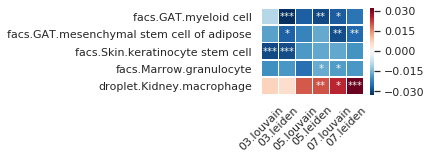

In [95]:
# throw out the empty ones
ind_select = df_analysis_tc.mean(axis=1)>-1
temp_df = df_analysis_tc.loc[ind_select]
bh_p_list = ['%s.bh_p'%x for x in cluster_method_list]
slope_list = ['%s.slope'%x for x in cluster_method_list]
# 1. at least 2 configurations have bh-p<0.2
# 2. direction of diversity change should be same
ind_select = (temp_df[bh_p_list]<0.2).sum(axis=1)>=2
n_up = (temp_df[slope_list]>0).sum(axis=1)
ind_select = ind_select & (n_up.isin([0,6])) 
ind_select = ind_select & np.array(['nan' not in x for x in temp_df.index])
temp_df = temp_df.loc[ind_select]
# record interesting cases
interesting_case_tc = list(temp_df.index)
# Heatmap
plot_df = temp_df[slope_list+bh_p_list]
ind_sort = np.argsort(plot_df[slope_list].mean(axis=1))
plot_df = plot_df.iloc[ind_sort]
# Convert bh_p_list to star_list
star_list = ['%s.star'%x for x in cluster_method_list]
for cluster_method in cluster_method_list:
    plot_df['%s.star'%cluster_method] = [assign_star(x)
                                         for x in plot_df['%s.bh_p'%cluster_method]]
plt.figure(figsize=[6,2.5])
sns.heatmap(plot_df[slope_list], cmap = 'RdBu_r', center=0,
            annot=plot_df[star_list], fmt="s", linewidths=.5)
plt.xticks(np.arange(len(slope_list)), [x.replace('.slope', '') for x in slope_list],
           rotation=45)
plt.tight_layout(rect=[0, 0.03, 0.95, 0.95])
plt.savefig(output_folder + '/selection_tc_significant.pdf')
plt.show()

droplet.Kidney.macrophage


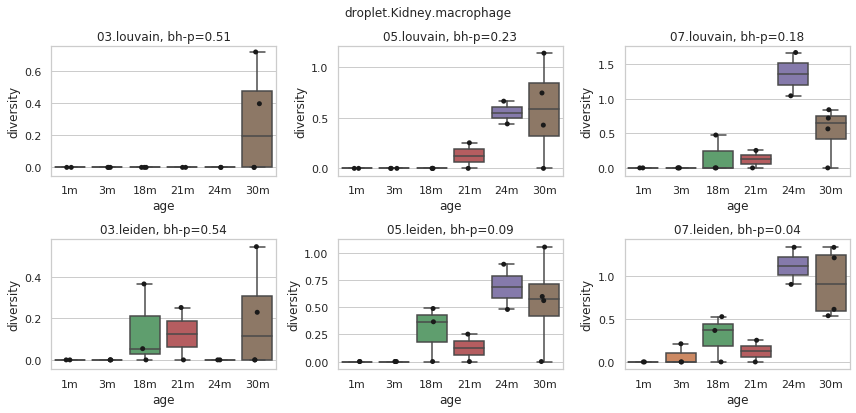

facs.GAT.mesenchymal stem cell of adipose


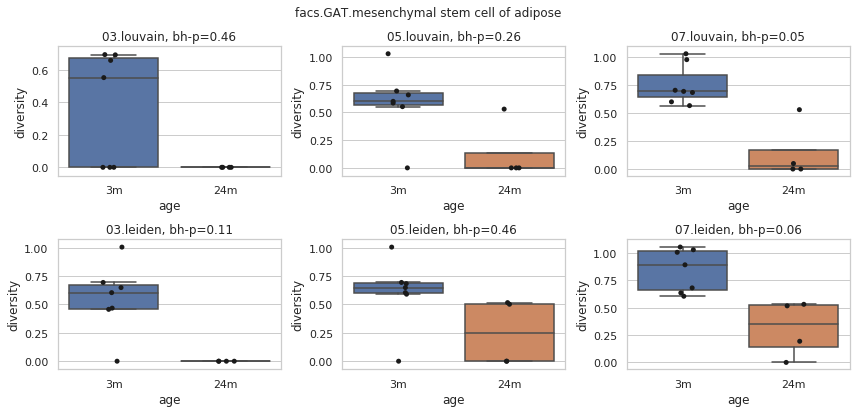

facs.GAT.myeloid cell


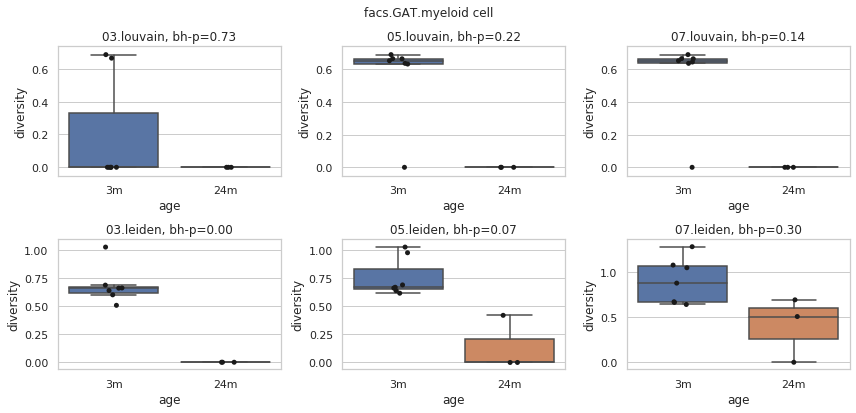

facs.Marrow.granulocyte


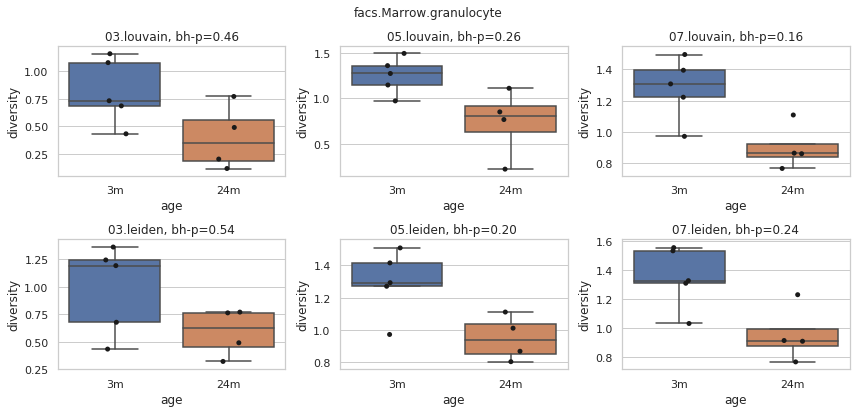

facs.Skin.keratinocyte stem cell


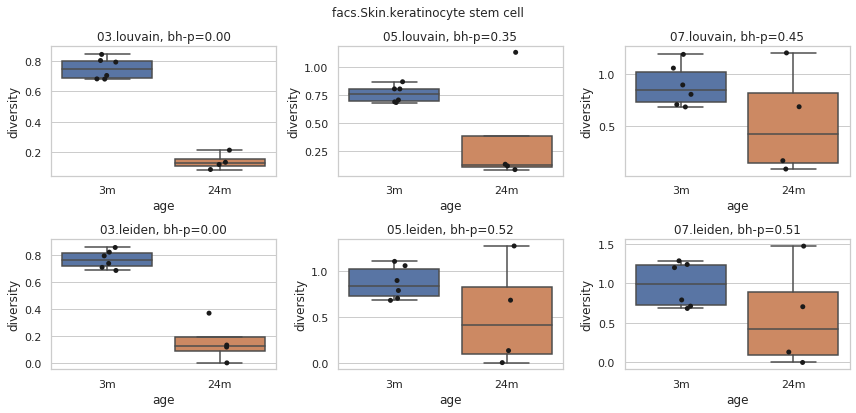

In [96]:
temp_cluster_method_list = ['03.louvain', '05.louvain', '07.louvain',
                            '03.leiden', '05.leiden', '07.leiden']
for analyte in temp_df.index:
    plt.figure(figsize=[12,6])
    i_pic = 0
    print(analyte)
    for cluster_method in temp_cluster_method_list:
        i_pic += 1
        plt.subplot(2,3,i_pic)
        temp_div = dic_div_tc[cluster_method].copy()
        temp_div = temp_div.join(df_annotation)
        temp_div = temp_div.loc[temp_div[analyte]>-1,[analyte, 'age']]
        # sorted age_list
        age_list = [int(x[:-1]) for x in list(set(temp_div['age']))]
        age_list.sort()
        age_list = ['%dm'%x for x in age_list]
        # plot figures
        sns.stripplot(y=analyte, x='age', data=temp_div,
                      order = age_list, color='k')
        sns.boxplot(y=analyte, x='age', data=temp_div,
                      order = age_list, fliersize=0)
        plt.ylabel('diversity')
        plt.title('%s, bh-p=%0.2f'%(cluster_method, temp_df.loc[analyte, '%s.bh_p'%cluster_method]))
    plt.suptitle(analyte)
#     plt.tight_layout()
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig(output_folder + '/diversity_%s.pdf'%analyte)
    plt.show()

### Some interesting cases 

In [63]:
def cluster_angela(input_adata, resolution_val=.7):
    adata = input_adata.copy()
    sc.pp.highly_variable_genes(adata, subset = False, min_disp=.5,
                                max_disp=None, min_mean=.0125, max_mean=10,
                                n_bins=20, n_top_genes=None)
    sc.pp.scale(adata, max_value=10, zero_center=False)
    sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
    sc.pp.neighbors(adata, n_neighbors=15, n_pcs=20)
    sc.tl.louvain(adata, resolution = resolution_val)
    sc.tl.leiden(adata, resolution = resolution_val)
    sc.tl.umap(adata)
    return adata

In [64]:
# list_interesting_analyte = ['droplet.Heart_and_Aorta', 'droplet.Limb_Muscle',
#                             'facs.Brain_Myeloid', 'droplet.Kidney.macrophage',
#                             'facs.Marrow.granulocyte', 'facs.Skin.keratinocyte stem cell']
list_interesting_analyte = interesting_case_tissue + interesting_case_tc

In [66]:
dic_data_intersting_case = {}
for analyte in list_interesting_analyte:
    if len(analyte.split('.'))==2:
        method,tissue = analyte.split('.')
    elif len(analyte.split('.'))==3:
        method,tissue,cell_type = analyte.split('.')
    else:
        continue
    ind_select = (adata_combine.obs['tissue'] == tissue) & \
                        (adata_combine.obs['b_method'] == method)
    temp_adata = adata_combine[ind_select]
    dic_data_intersting_case[analyte] = cluster_angela(temp_adata)
#     break

/home/martin/anaconda3/lib/python3.6/site-packages/scanpy/preprocessing/_simple.py:1123: RuntimeWarning: divide by zero encountered in true_divide
  sparsefuncs.inplace_column_scale(X, 1/scale)
/home/martin/anaconda3/lib/python3.6/site-packages/scanpy/preprocessing/_simple.py:1123: RuntimeWarning: divide by zero encountered in true_divide
  sparsefuncs.inplace_column_scale(X, 1/scale)
/home/martin/anaconda3/lib/python3.6/site-packages/scanpy/preprocessing/_simple.py:1123: RuntimeWarning: divide by zero encountered in true_divide
  sparsefuncs.inplace_column_scale(X, 1/scale)
/home/martin/anaconda3/lib/python3.6/site-packages/scanpy/preprocessing/_simple.py:1123: RuntimeWarning: divide by zero encountered in true_divide
  sparsefuncs.inplace_column_scale(X, 1/scale)
/home/martin/anaconda3/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components
/home/martin/anaconda3/lib/python3

droplet.Heart_and_Aorta


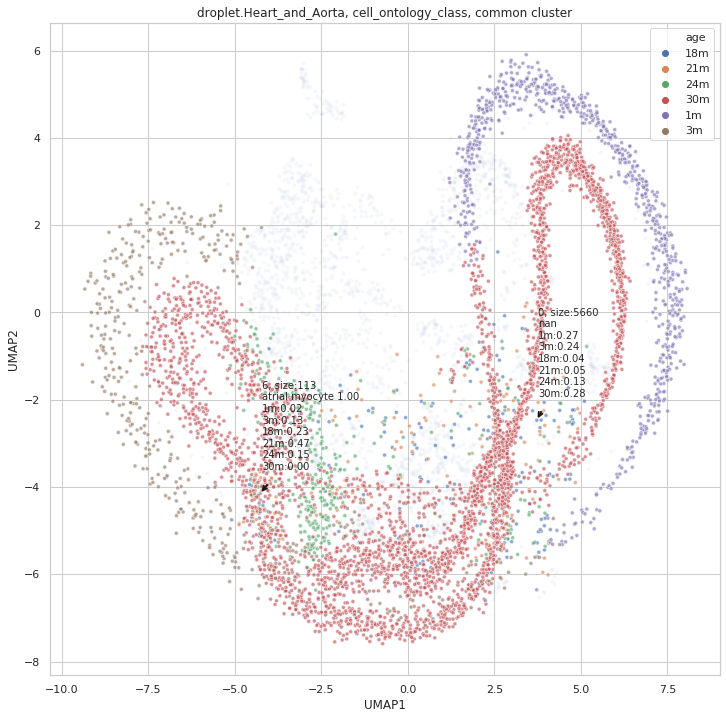

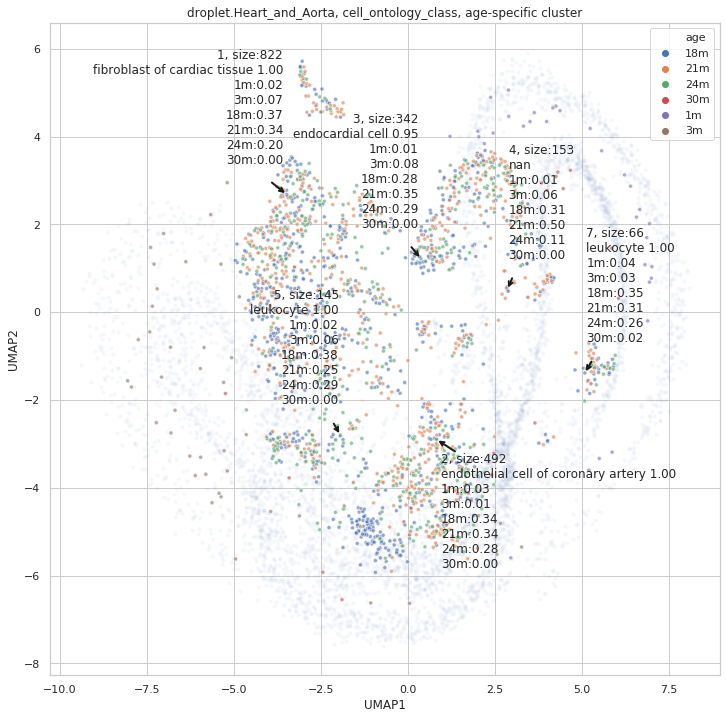

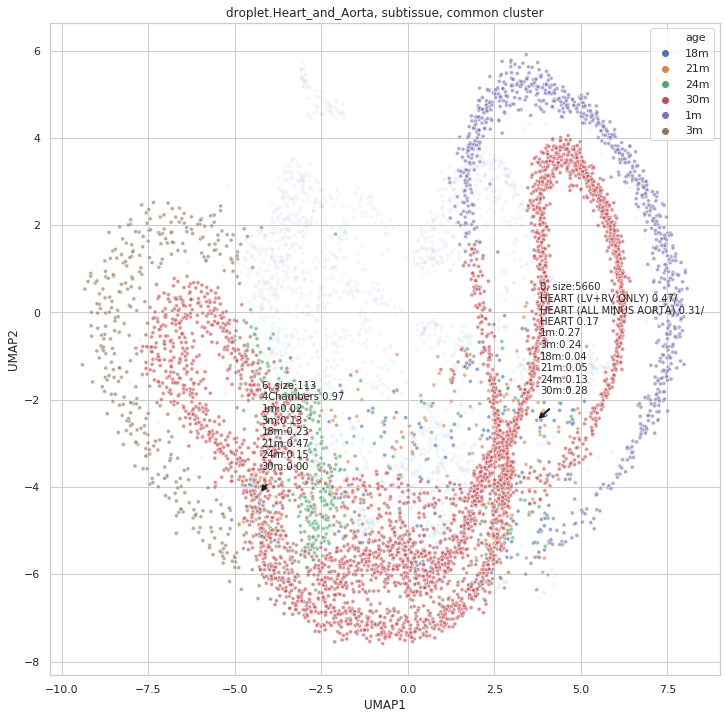

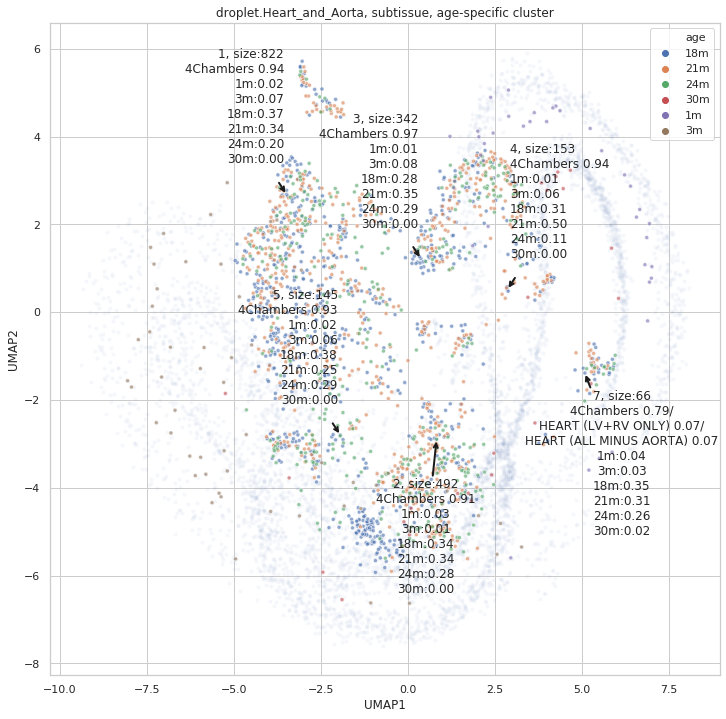

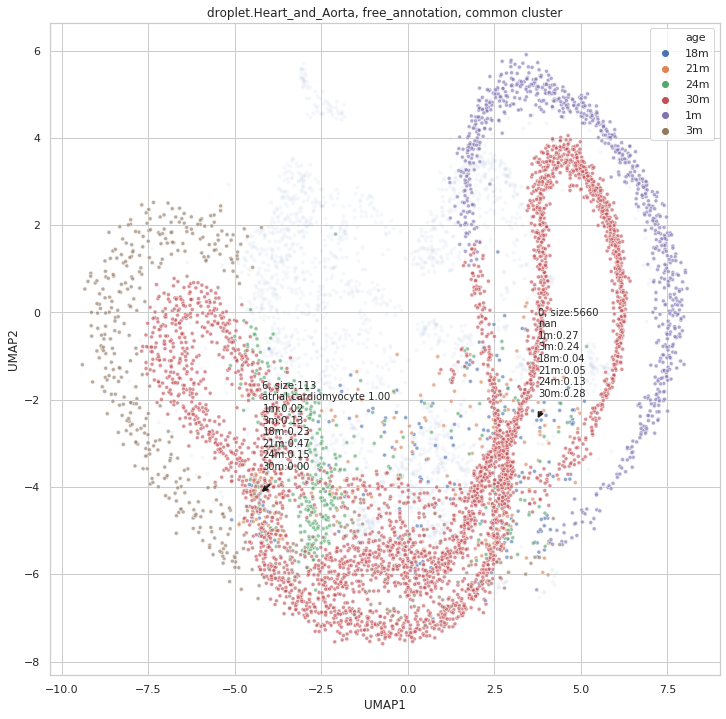

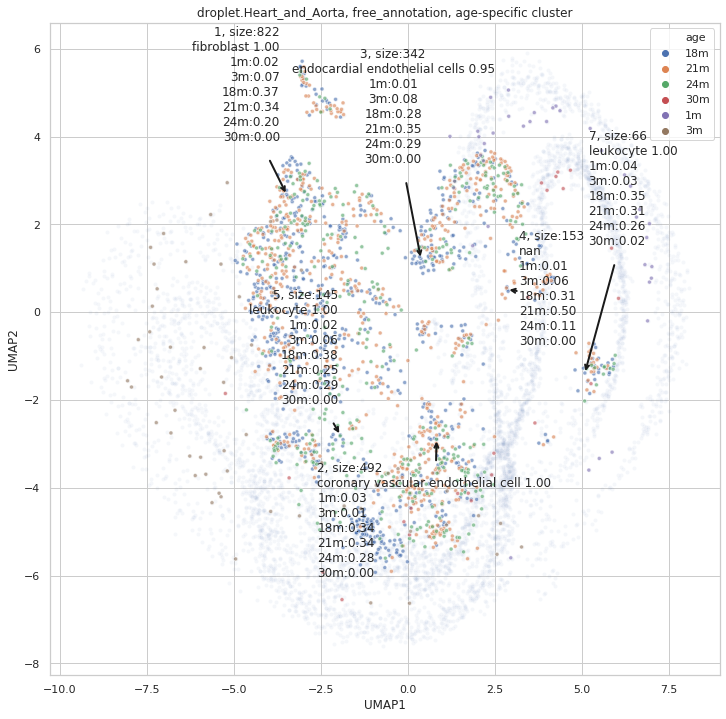

droplet.Limb_Muscle


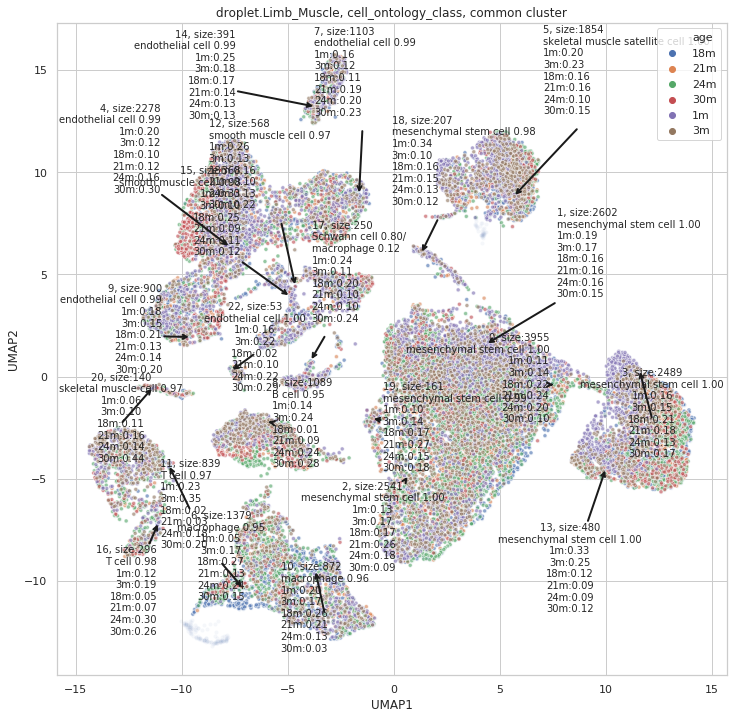

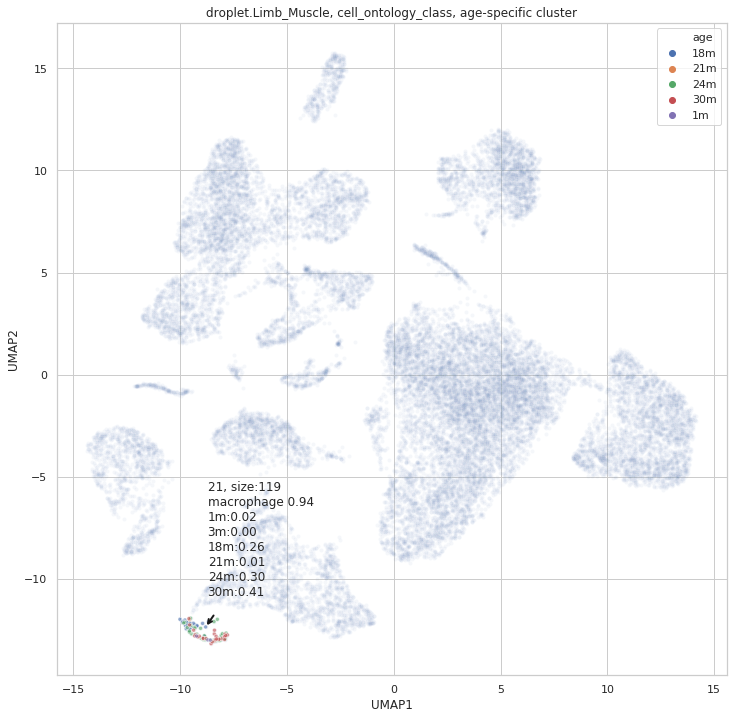

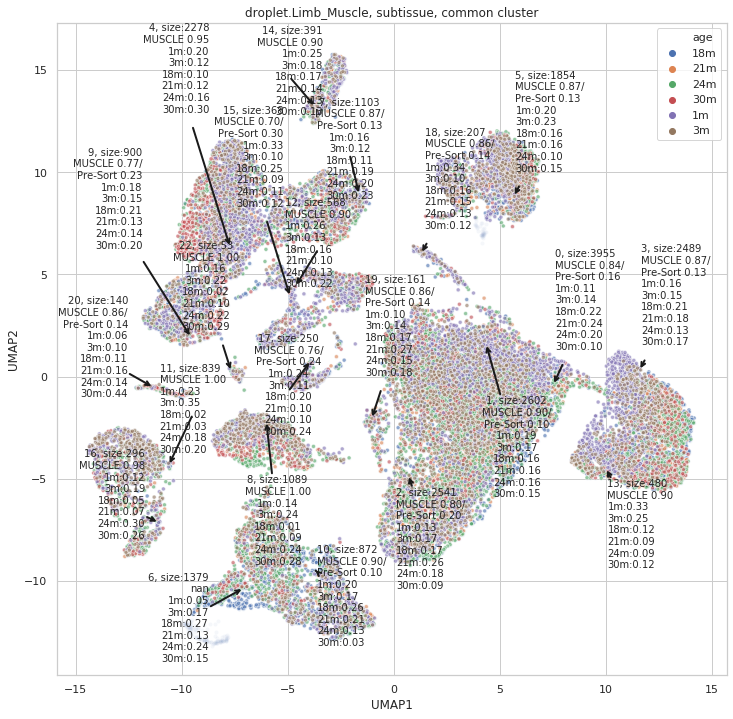

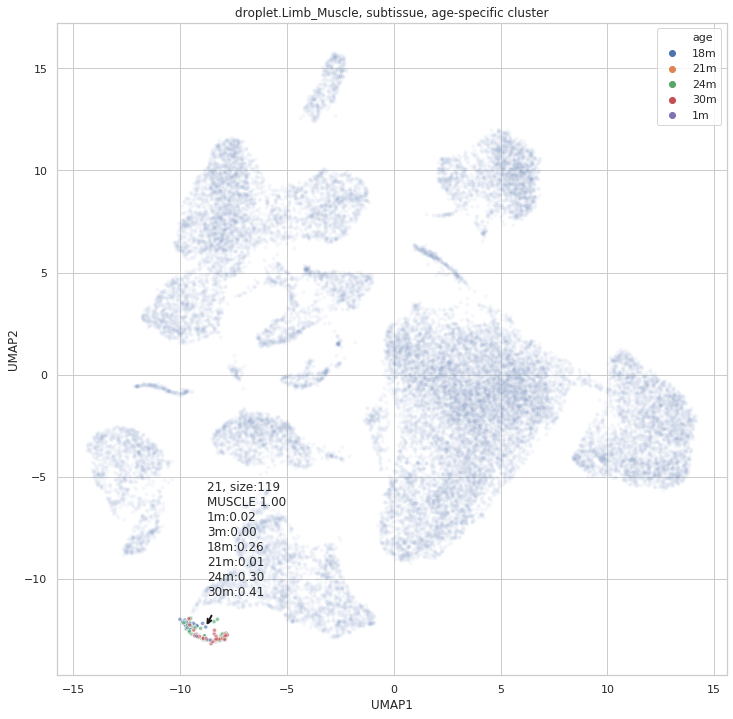

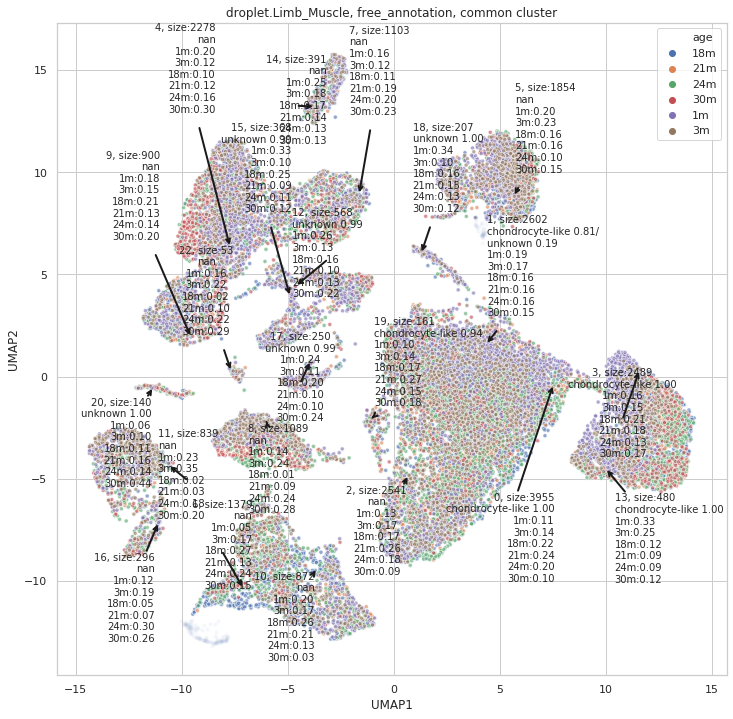

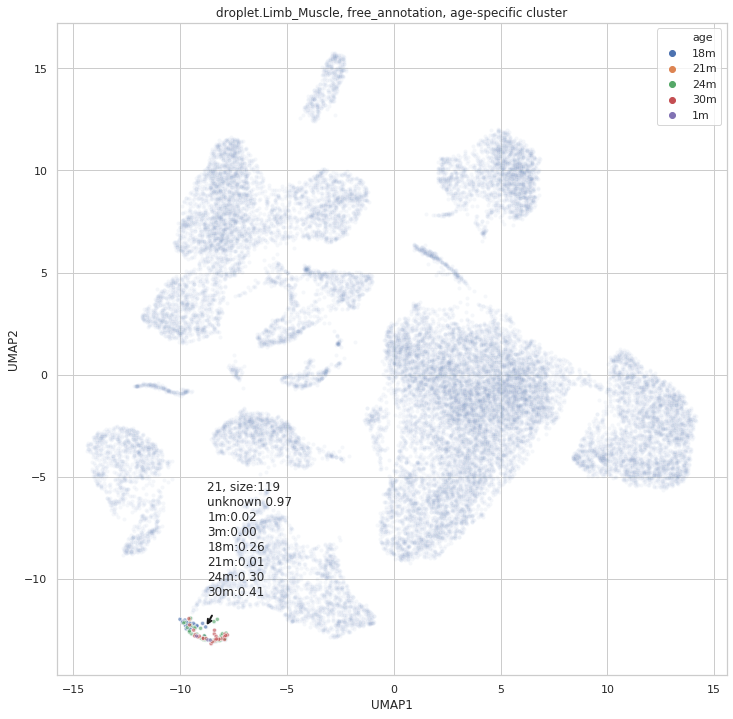

facs.Brain_Myeloid


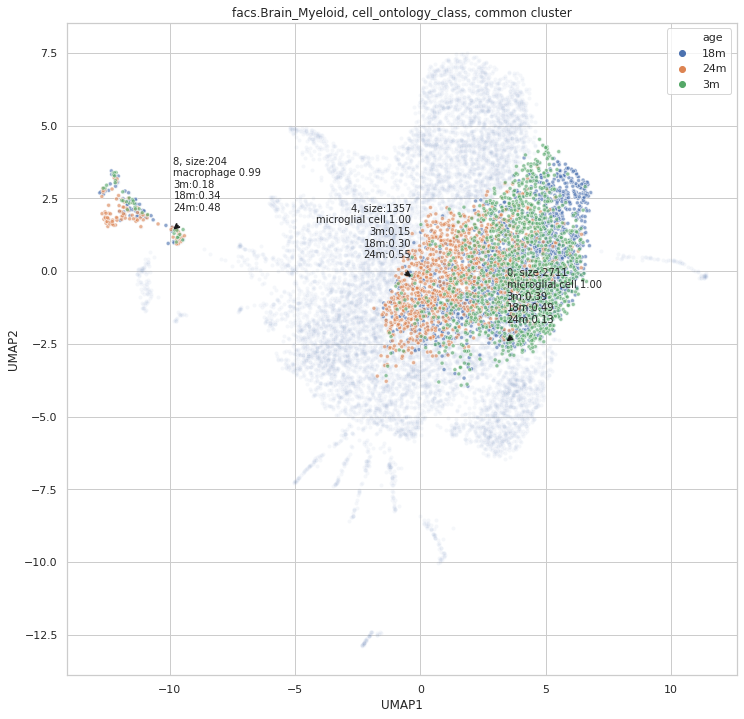

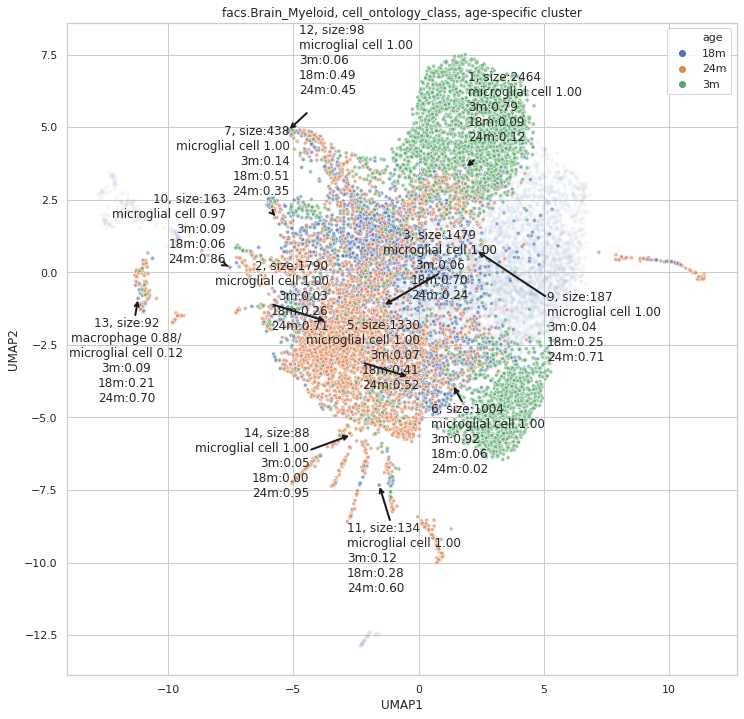

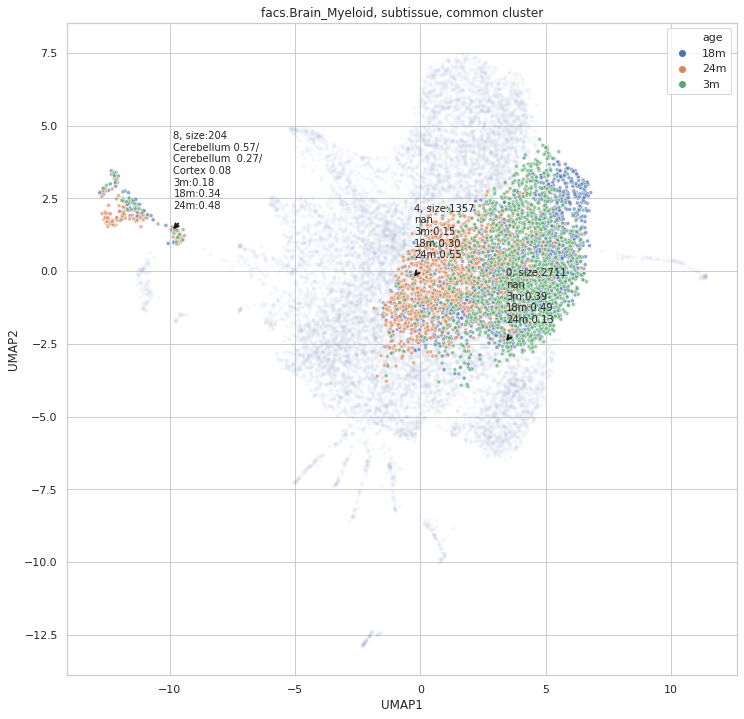

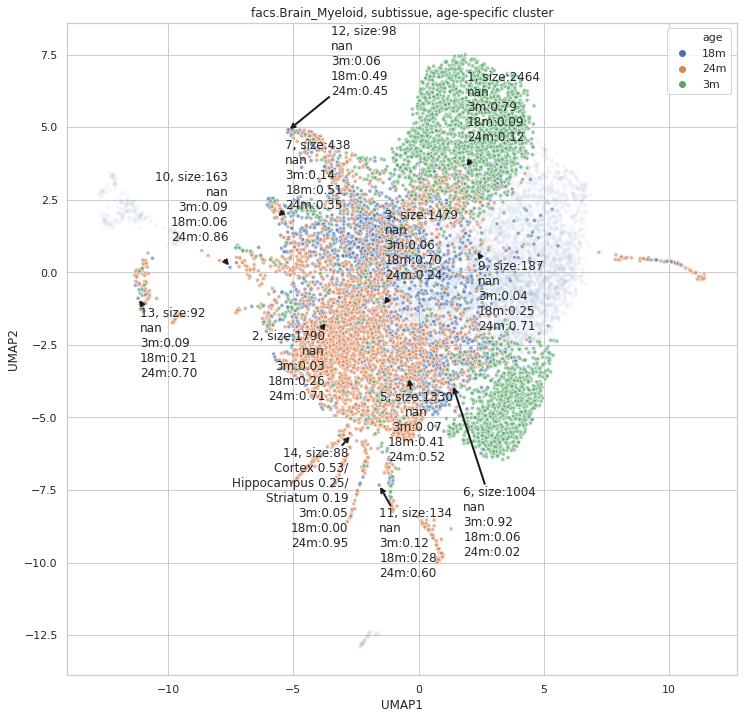

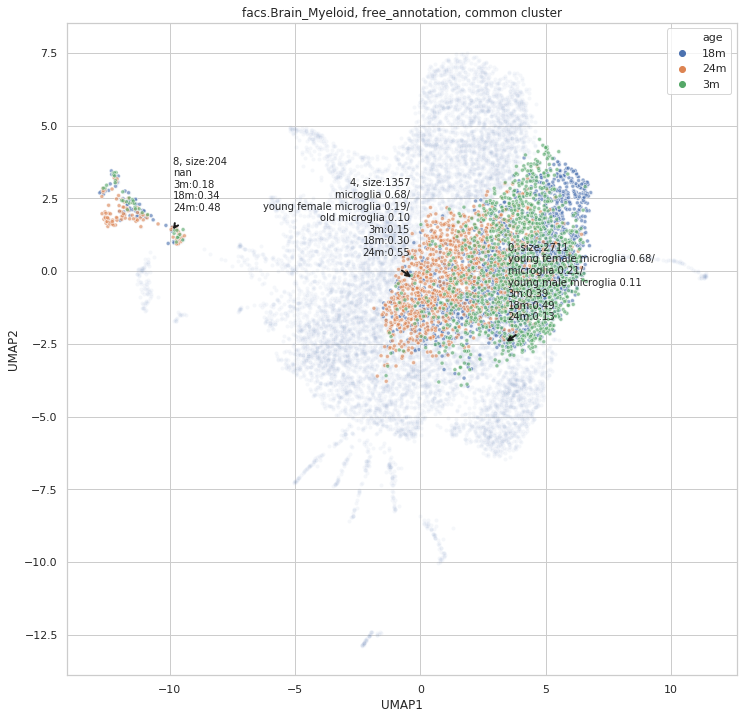

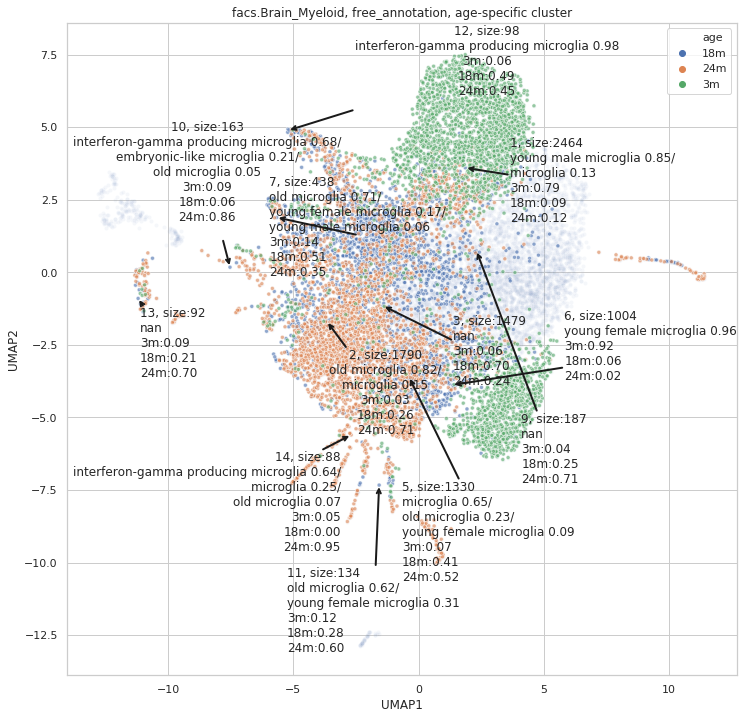

facs.Heart


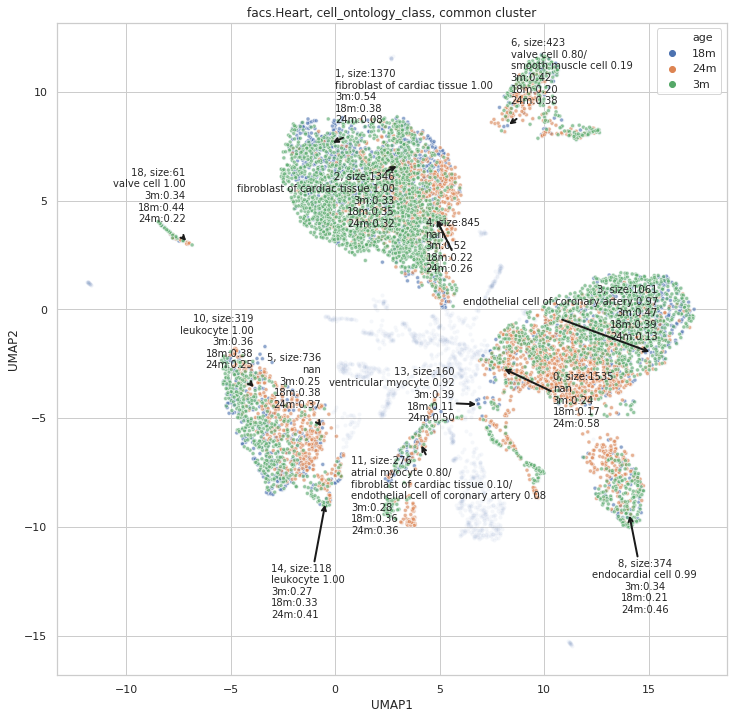

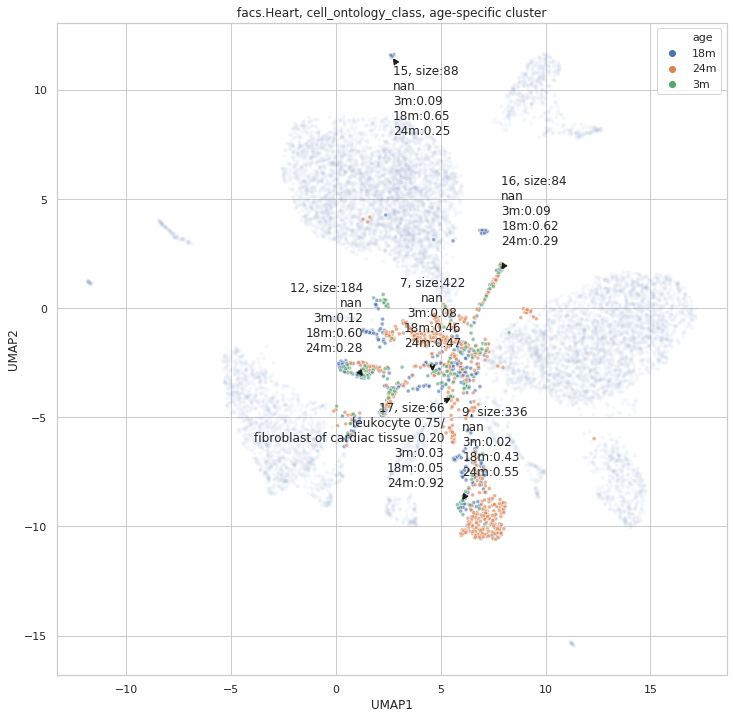

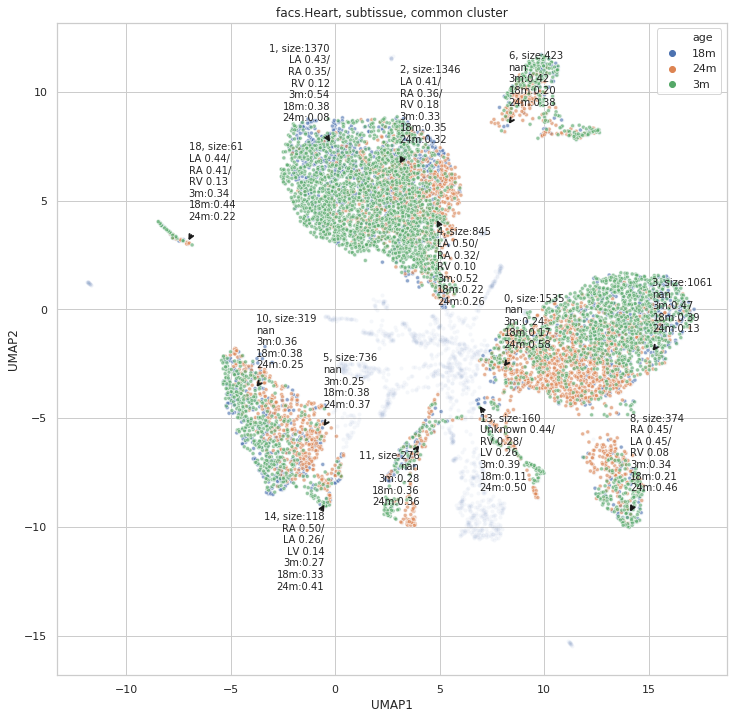

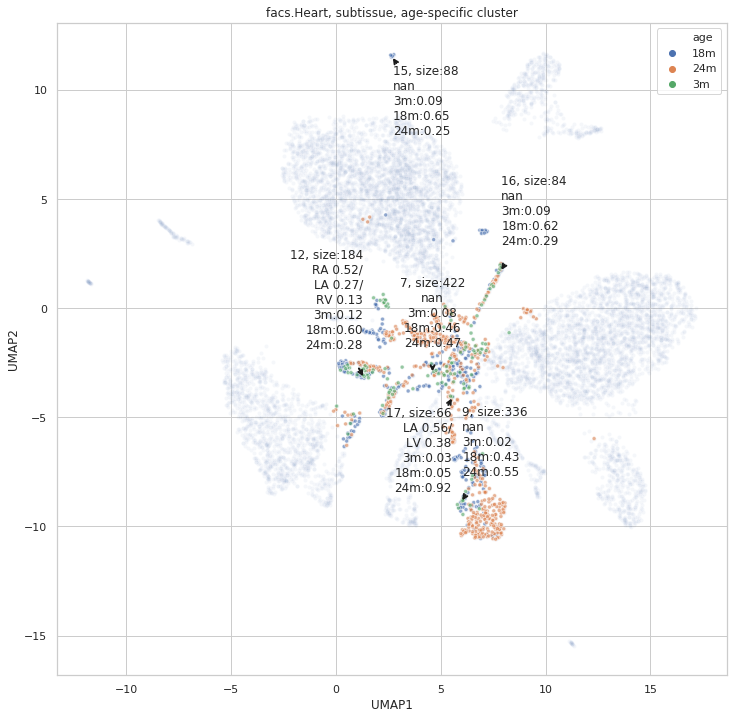

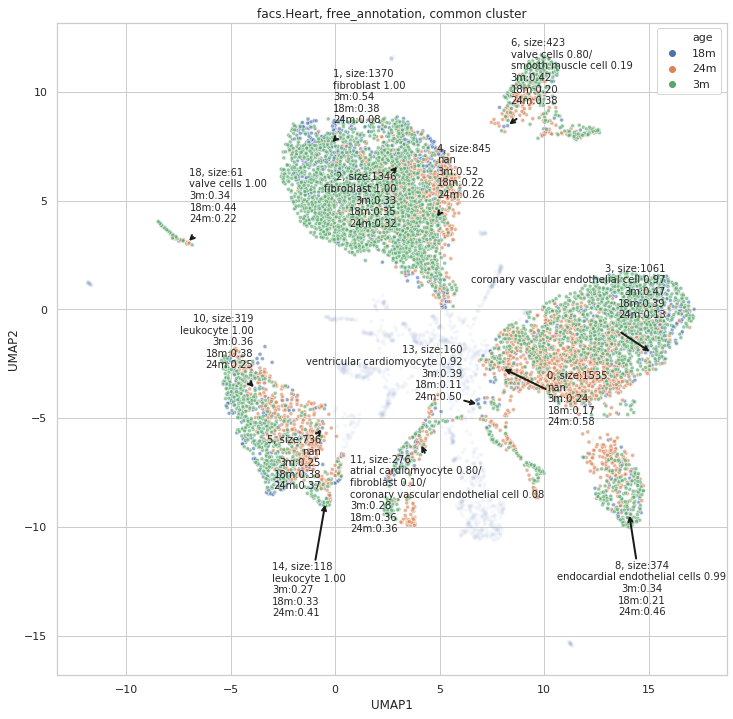

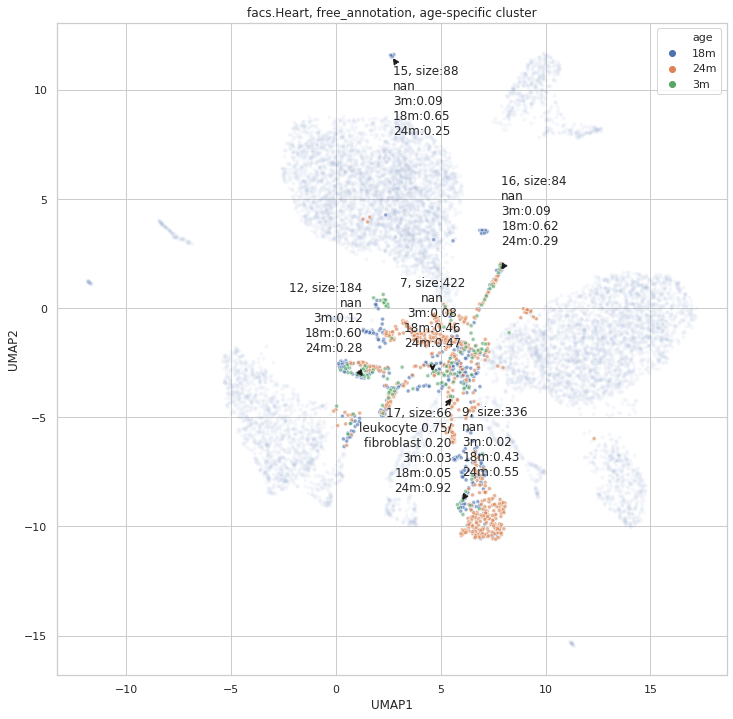

facs.Marrow


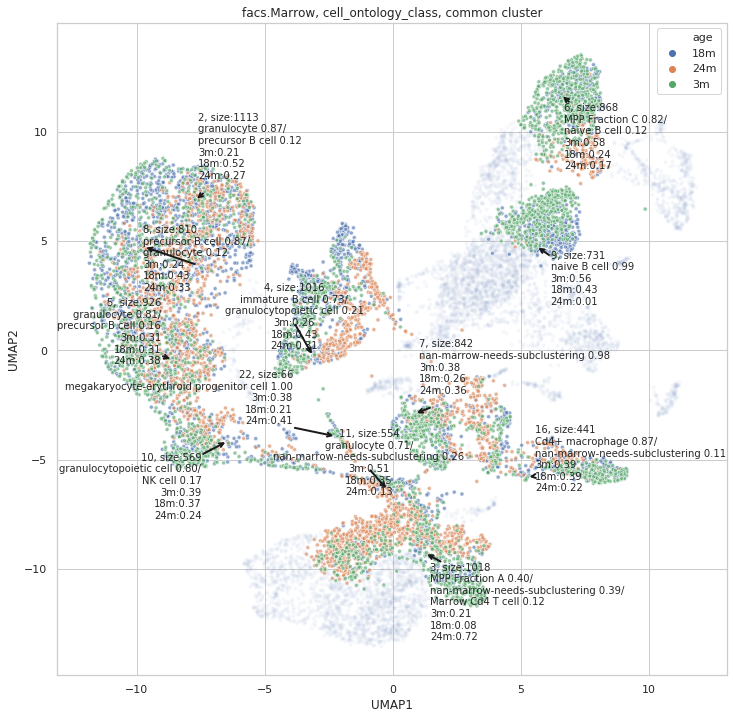

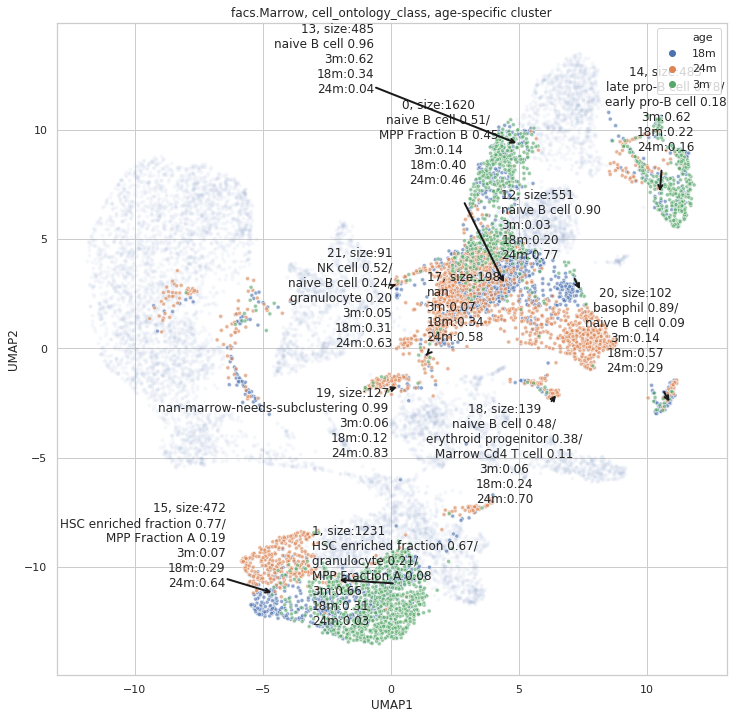

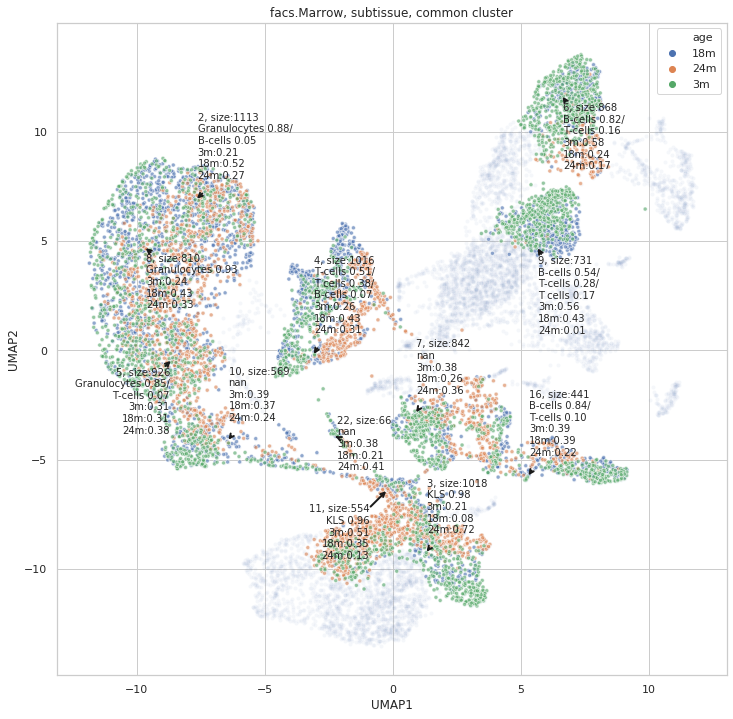

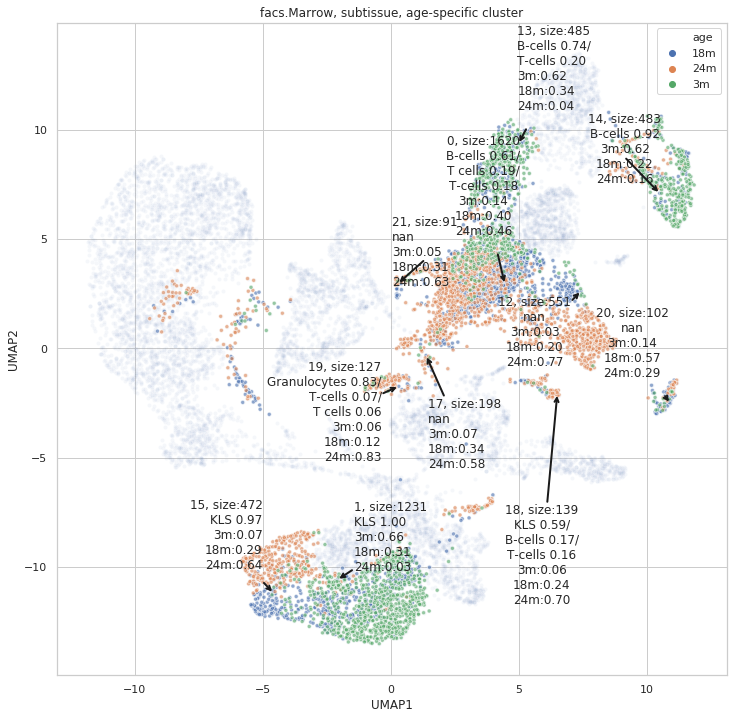

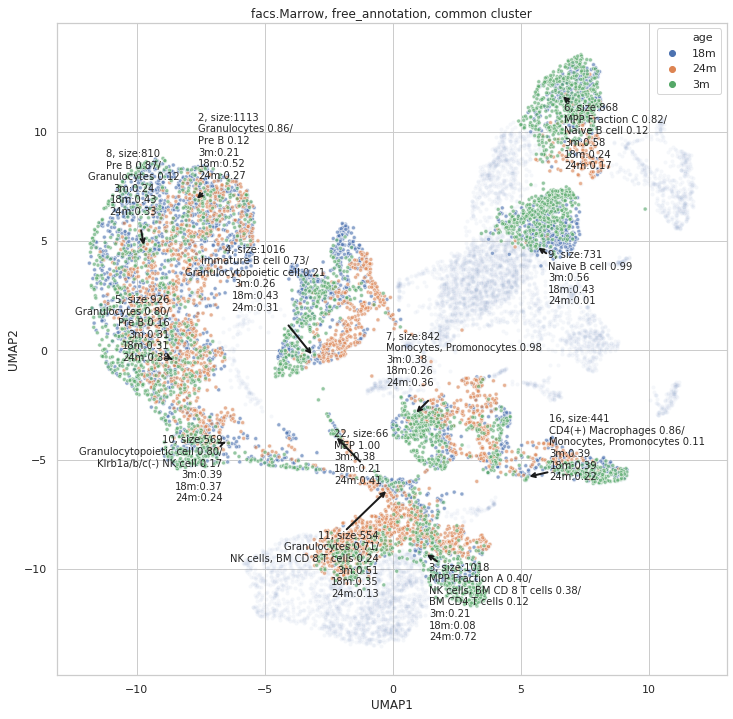

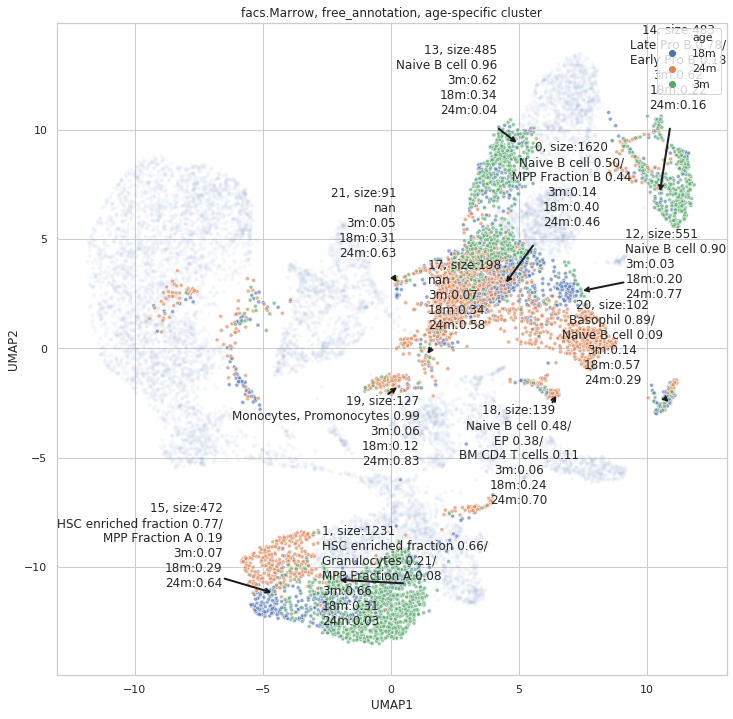

Trying to set attribute `.obs` of view, making a copy.


droplet.Kidney.macrophage


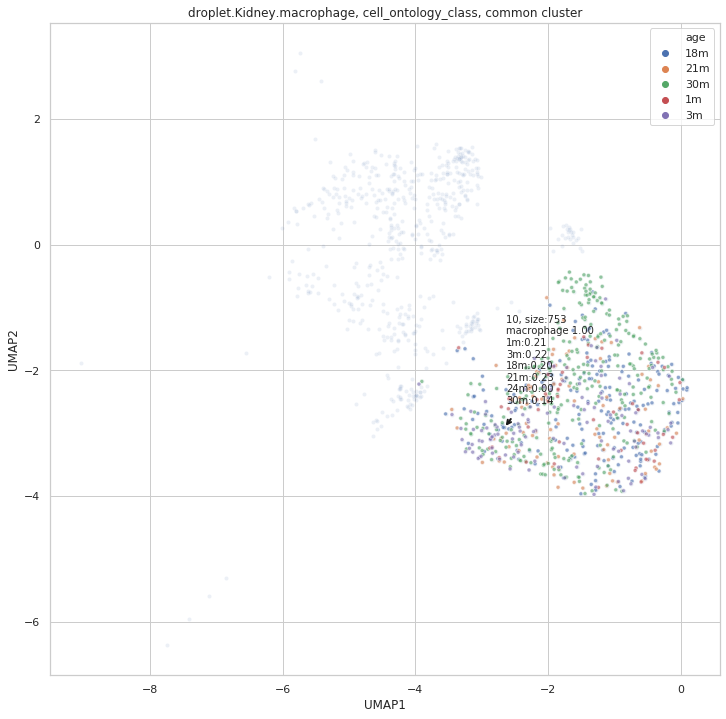

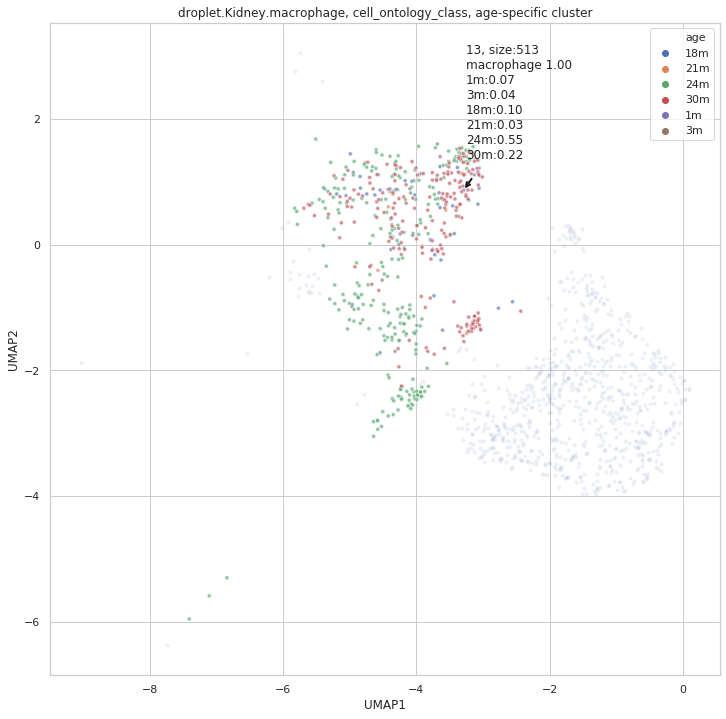

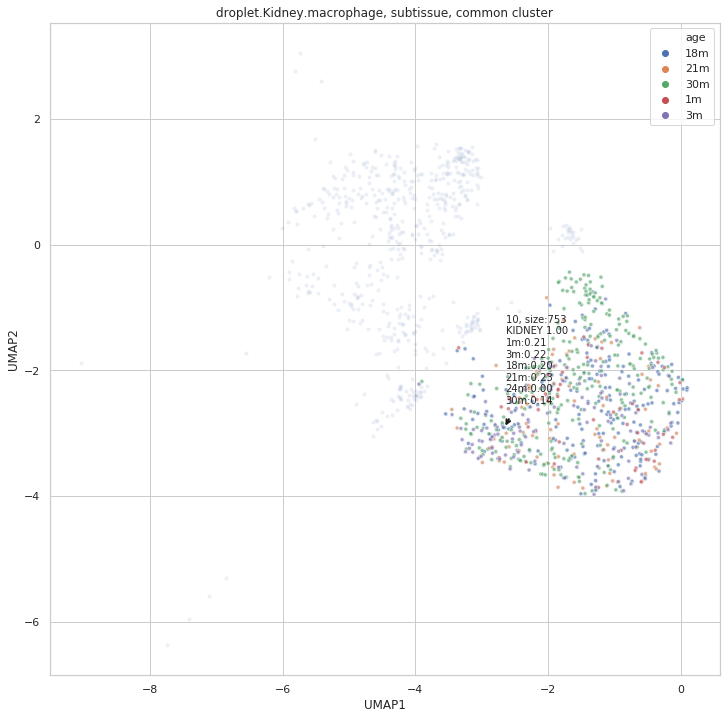

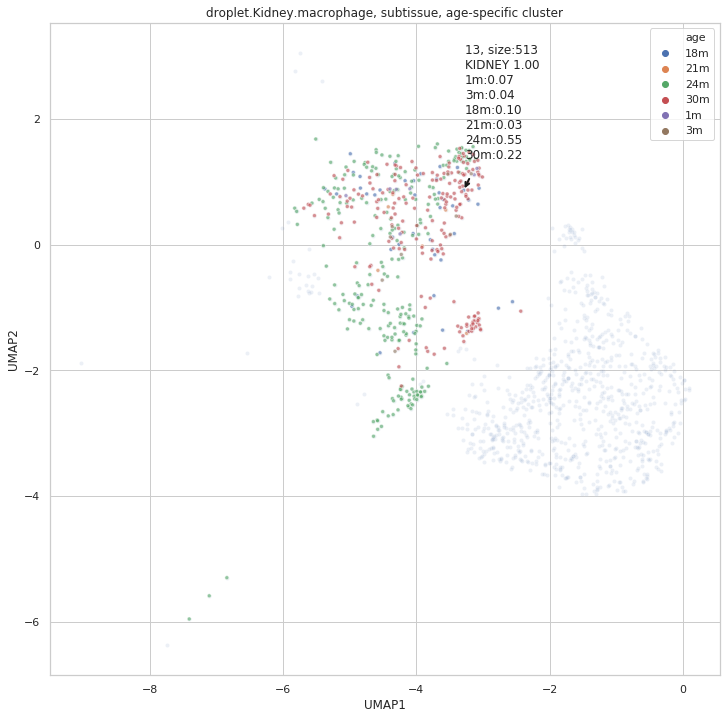

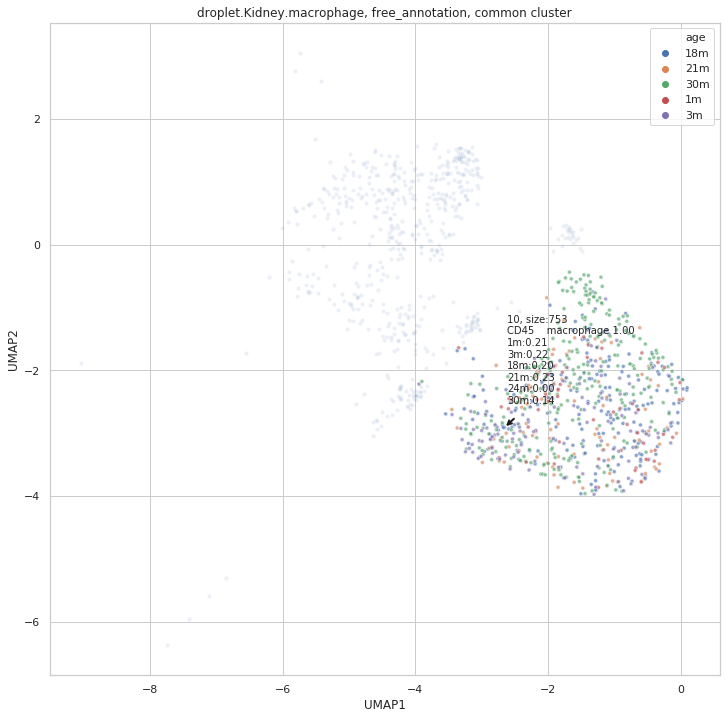

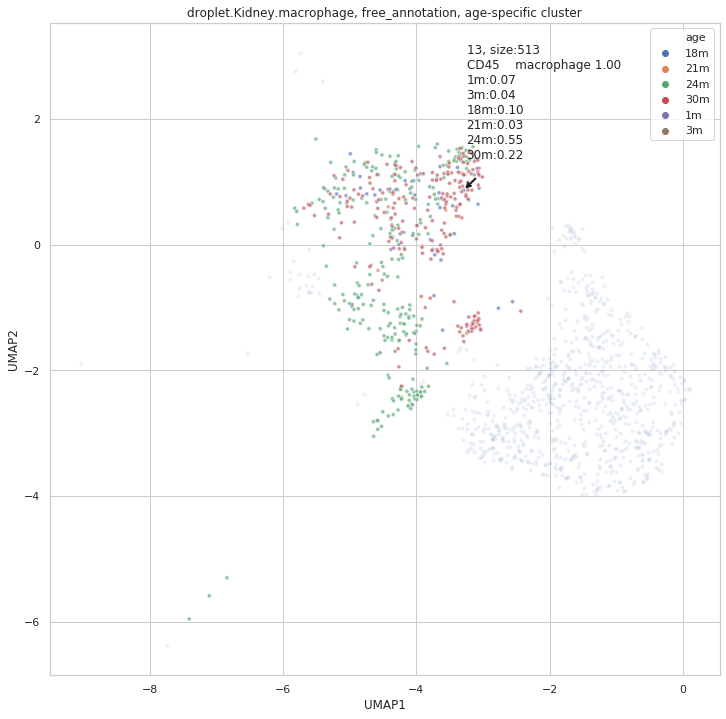

Trying to set attribute `.obs` of view, making a copy.


facs.GAT.mesenchymal stem cell of adipose


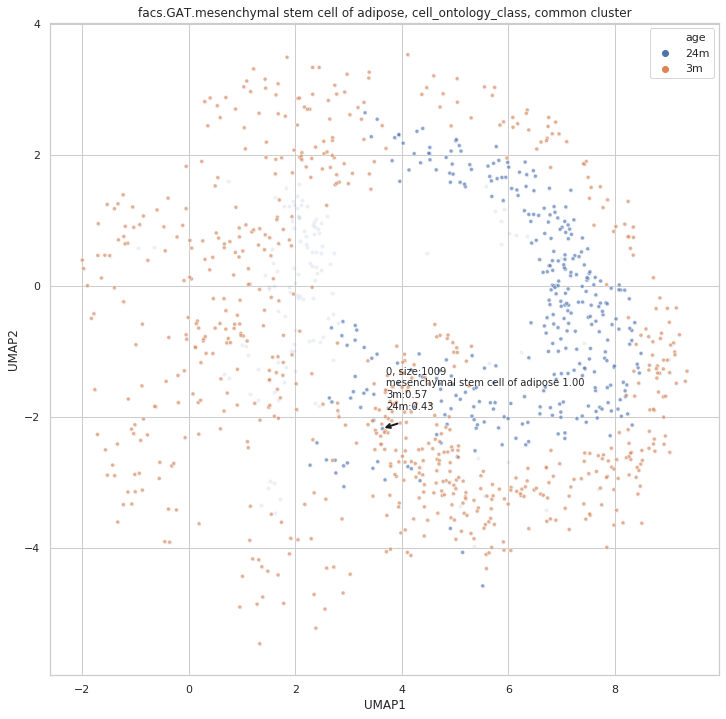

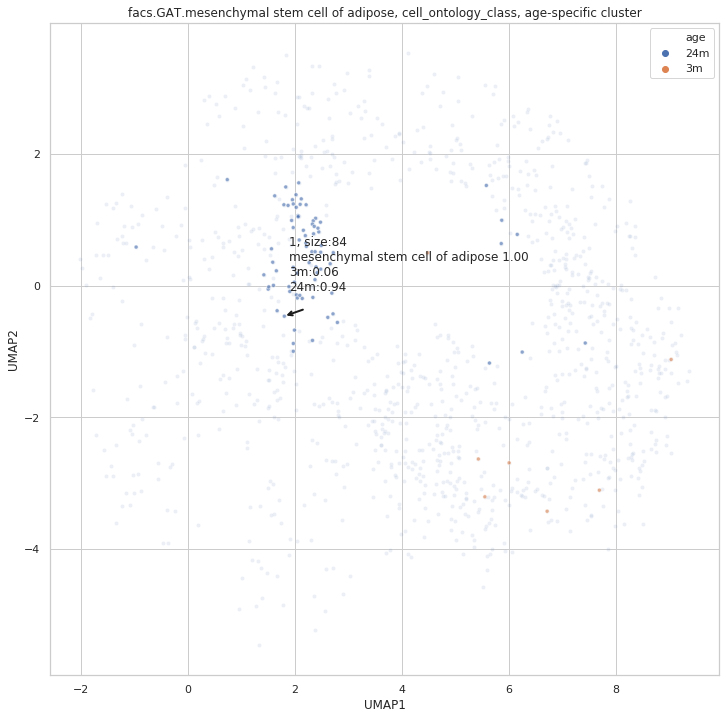

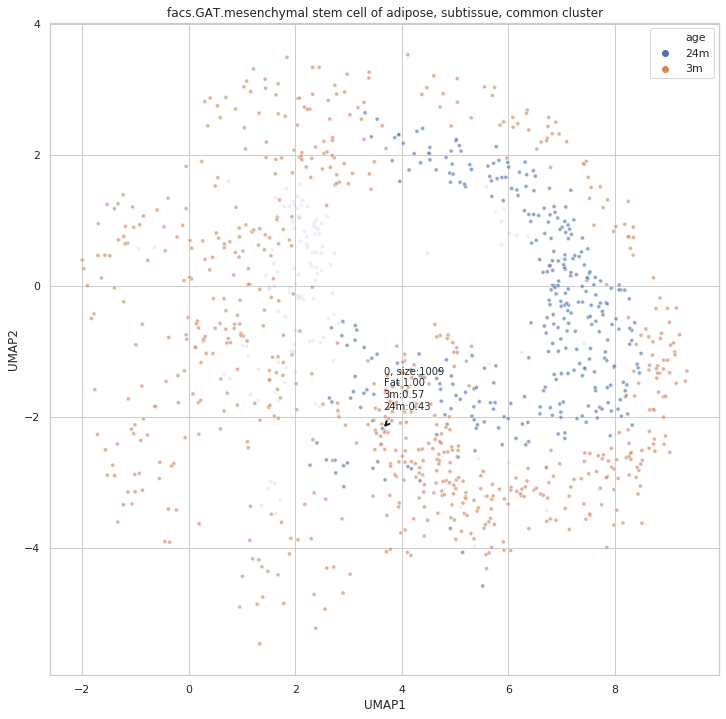

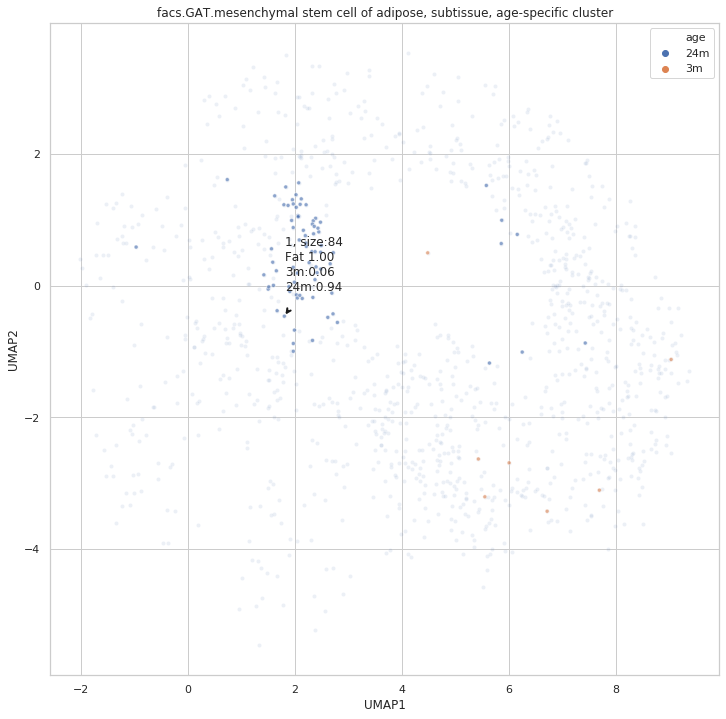

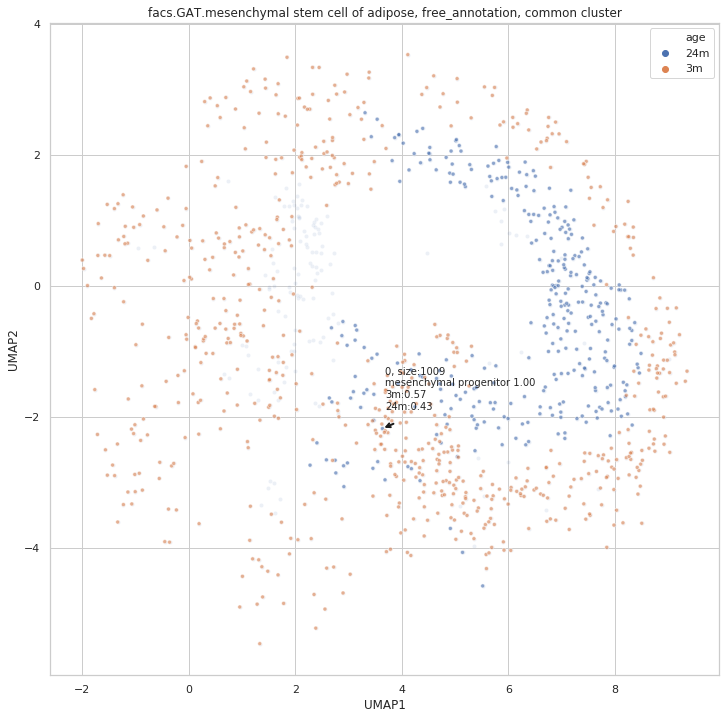

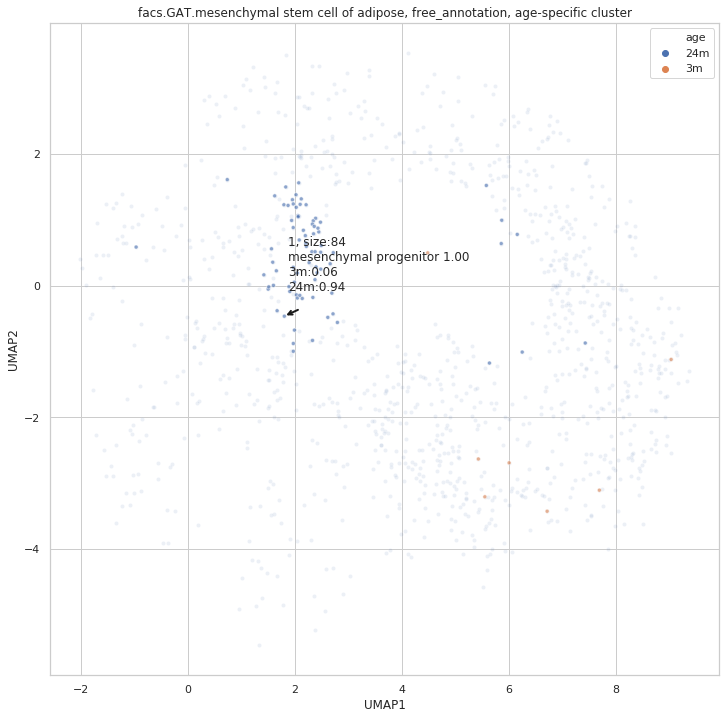

Trying to set attribute `.obs` of view, making a copy.


facs.GAT.myeloid cell


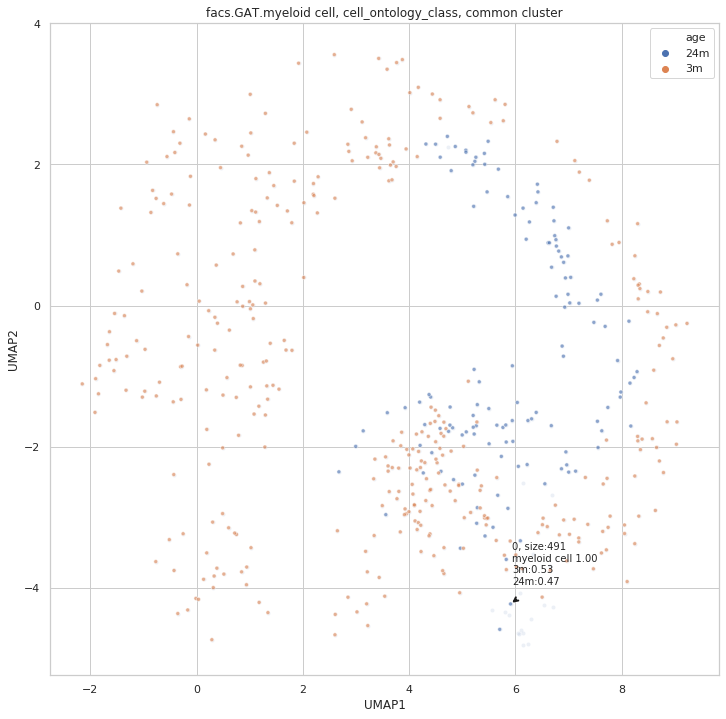

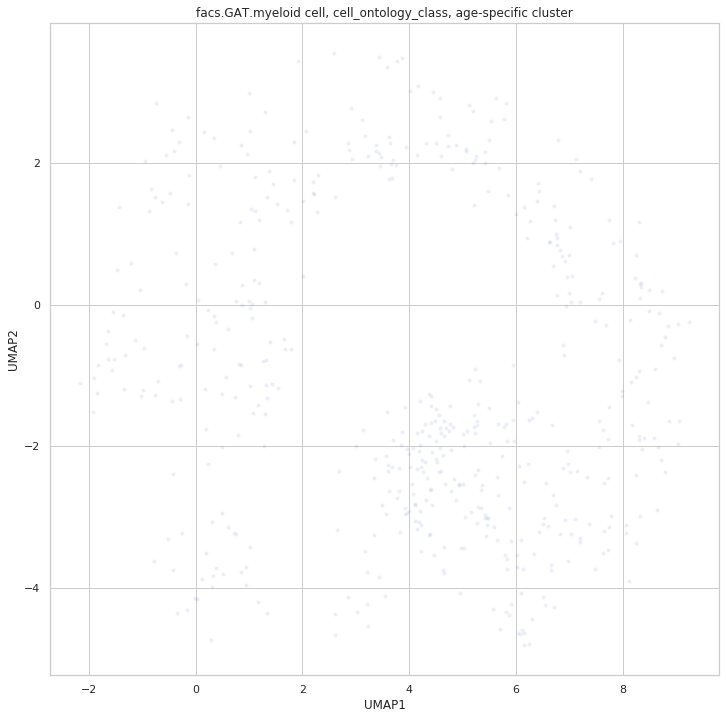

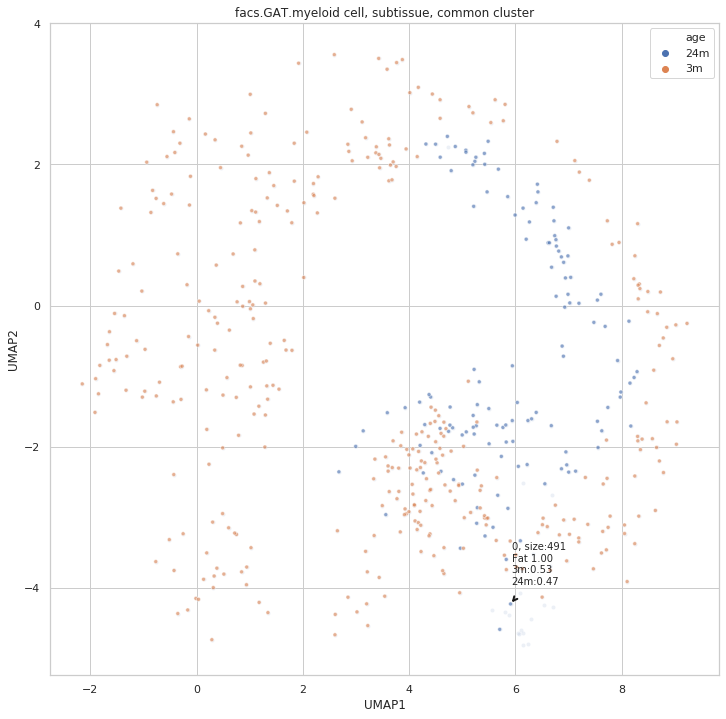

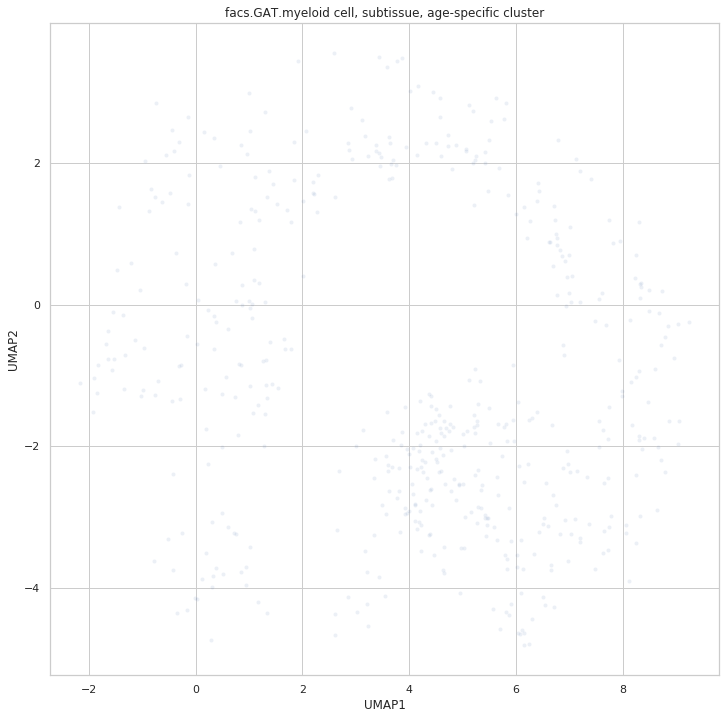

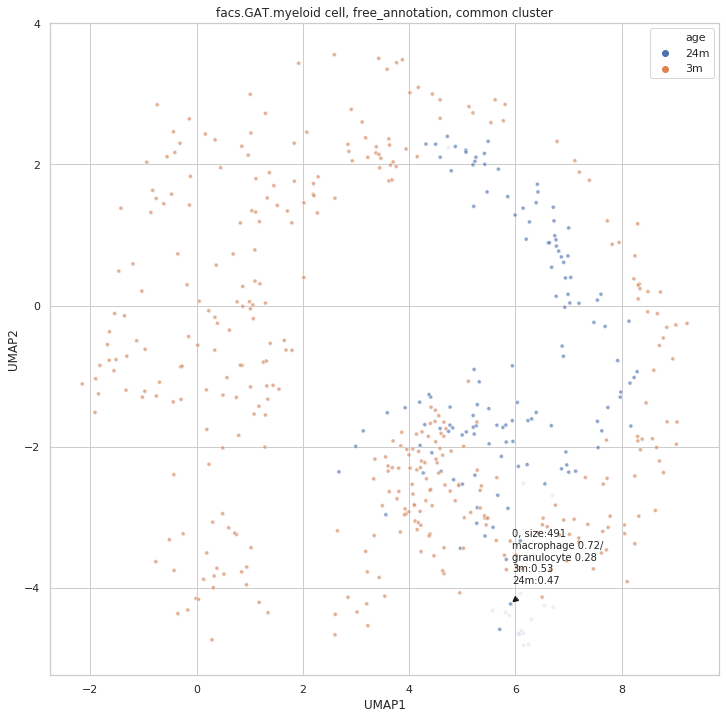

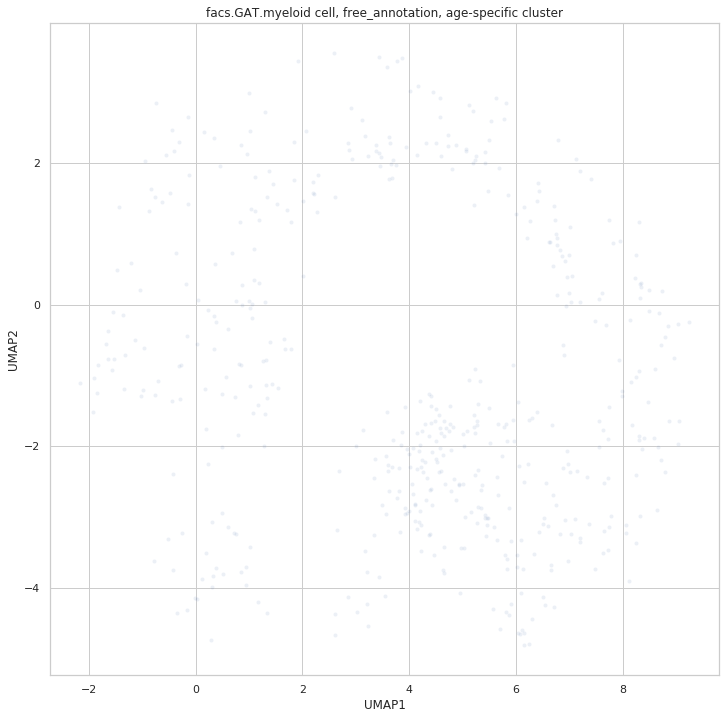

Trying to set attribute `.obs` of view, making a copy.


facs.Marrow.granulocyte


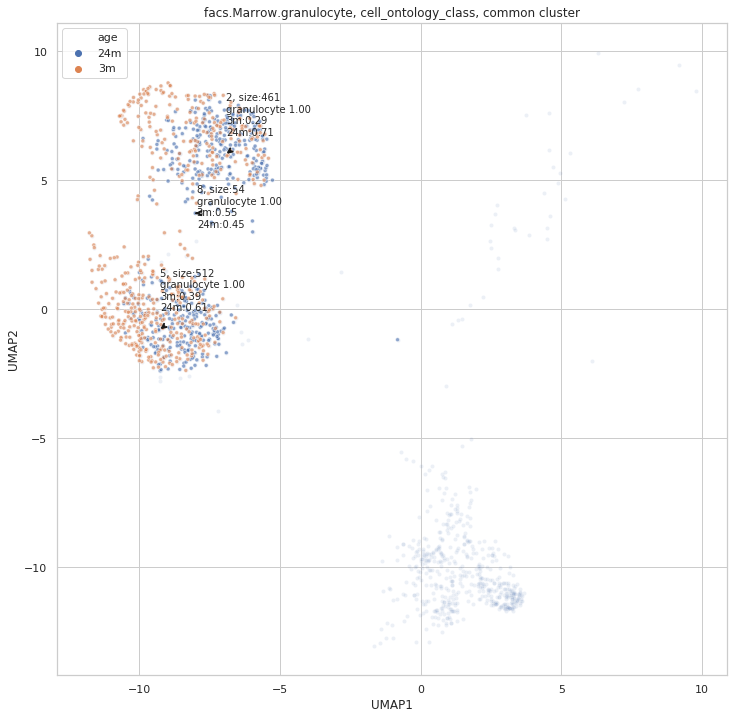

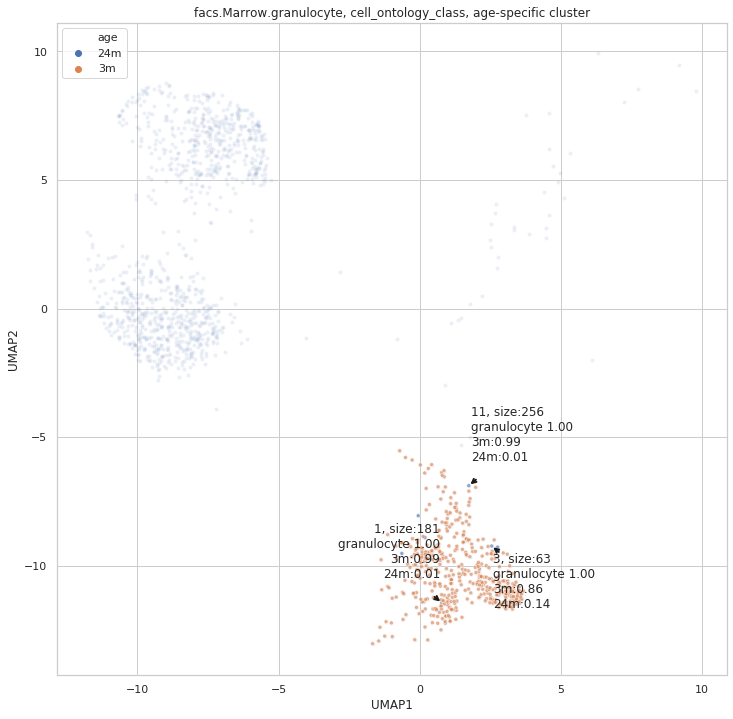

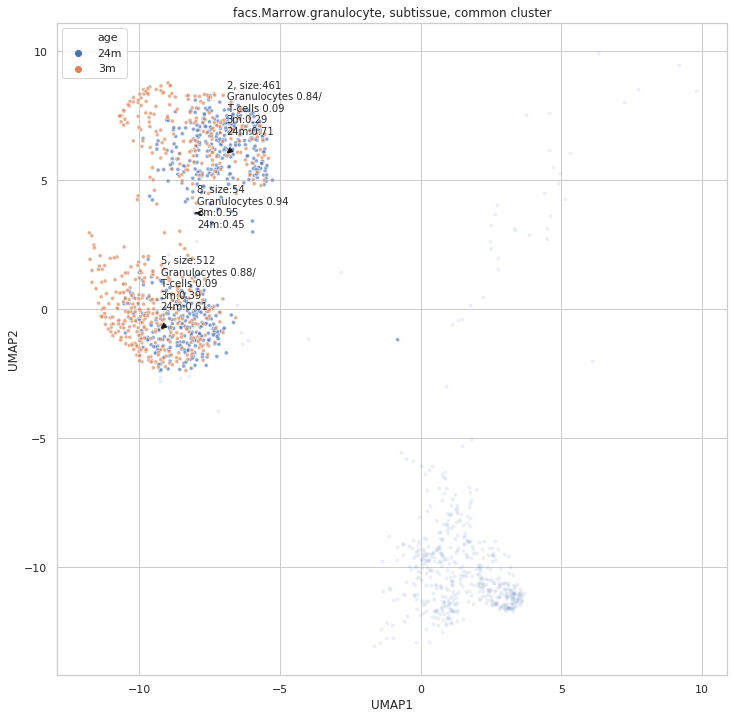

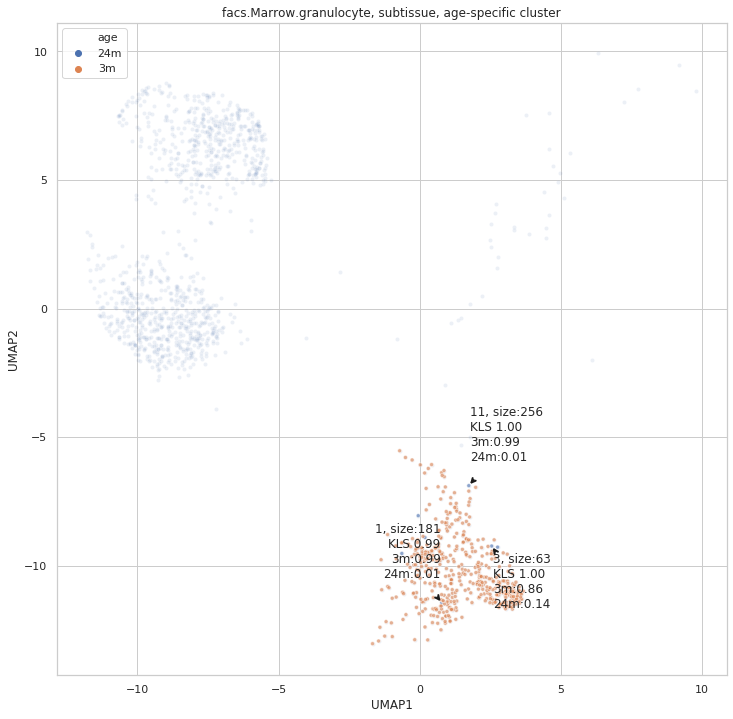

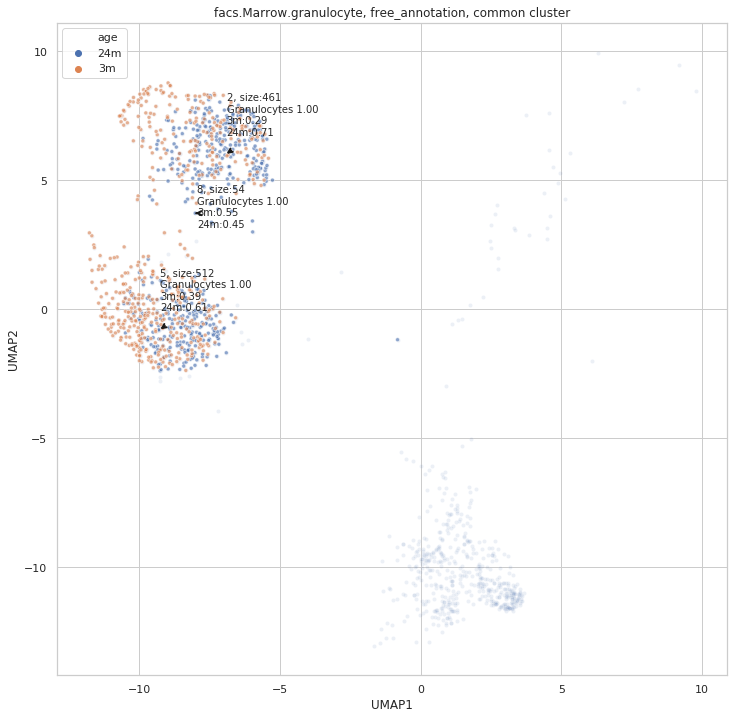

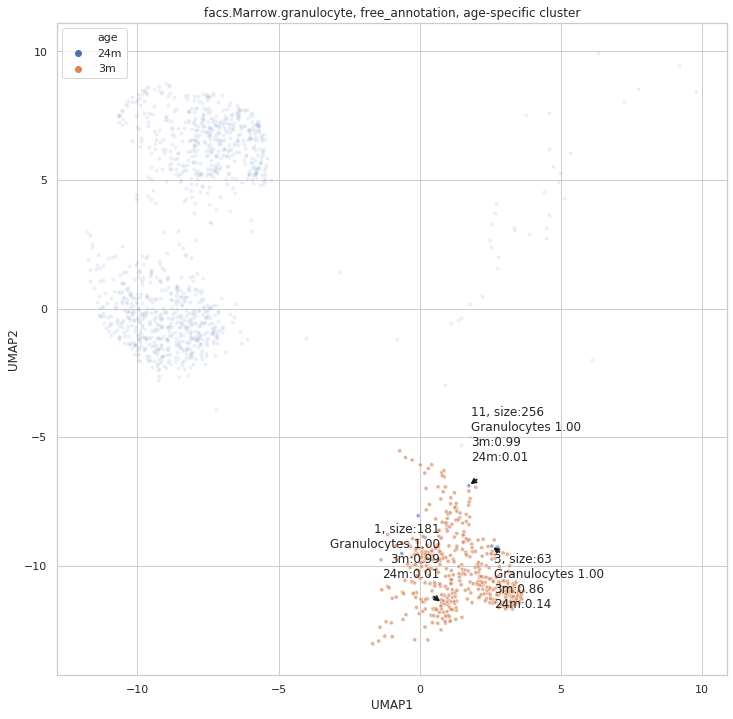

Trying to set attribute `.obs` of view, making a copy.


facs.Skin.keratinocyte stem cell


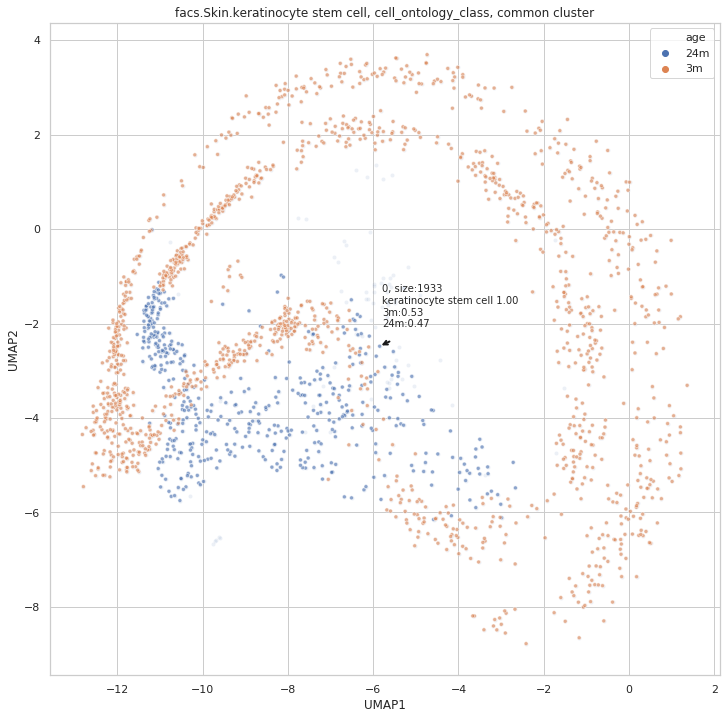

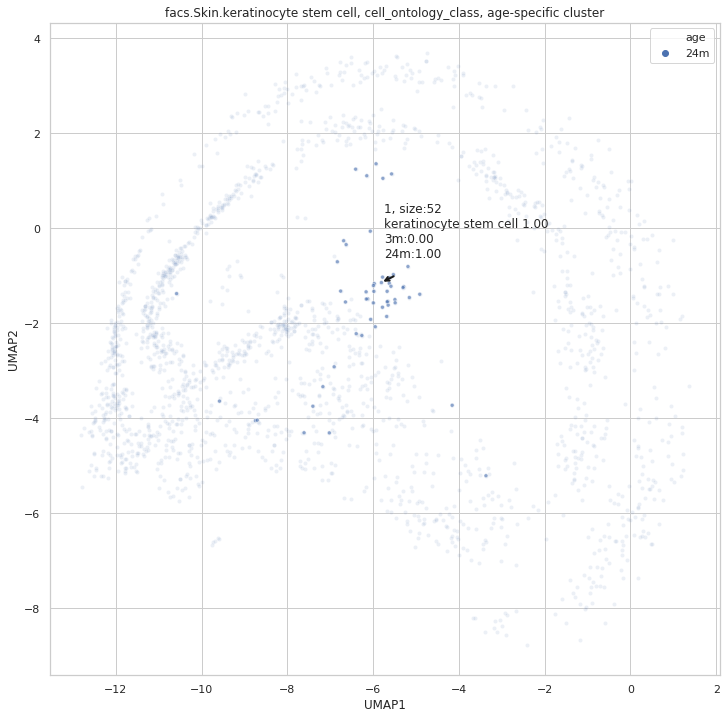

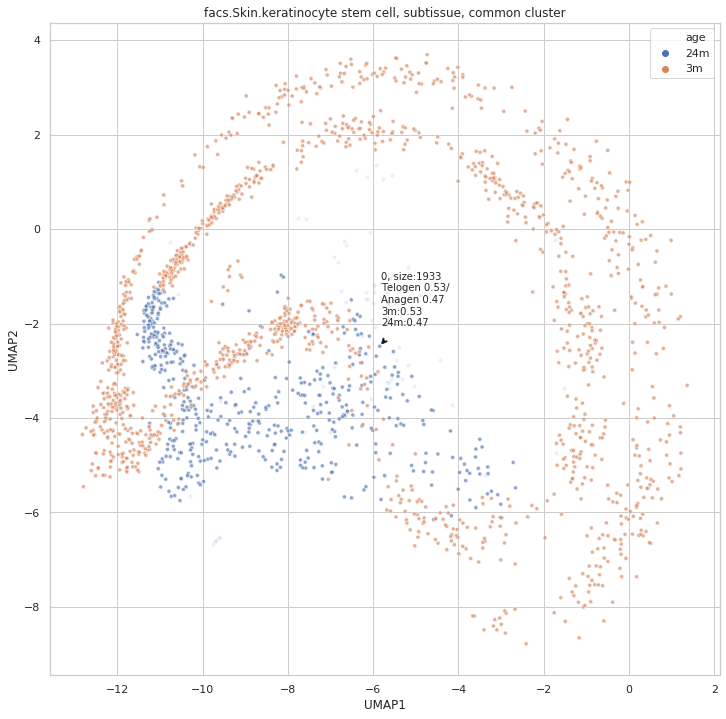

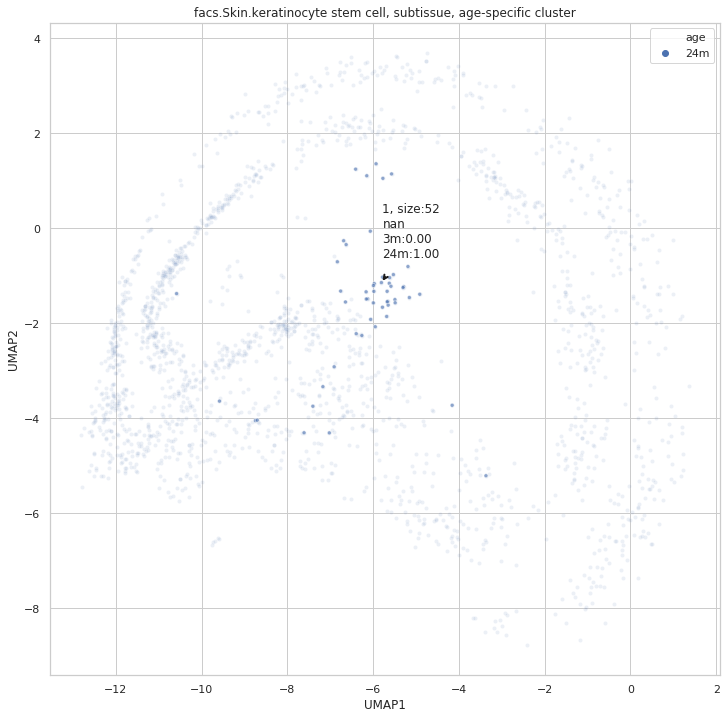

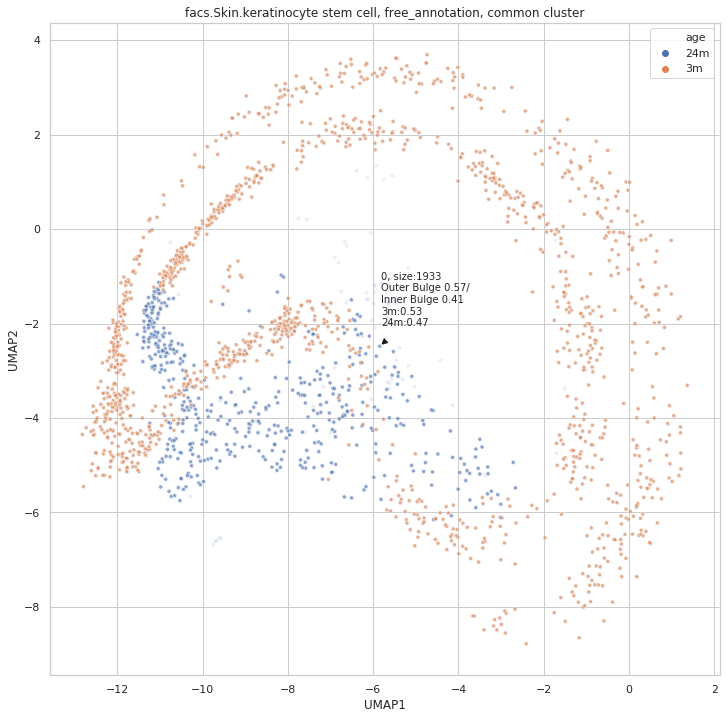

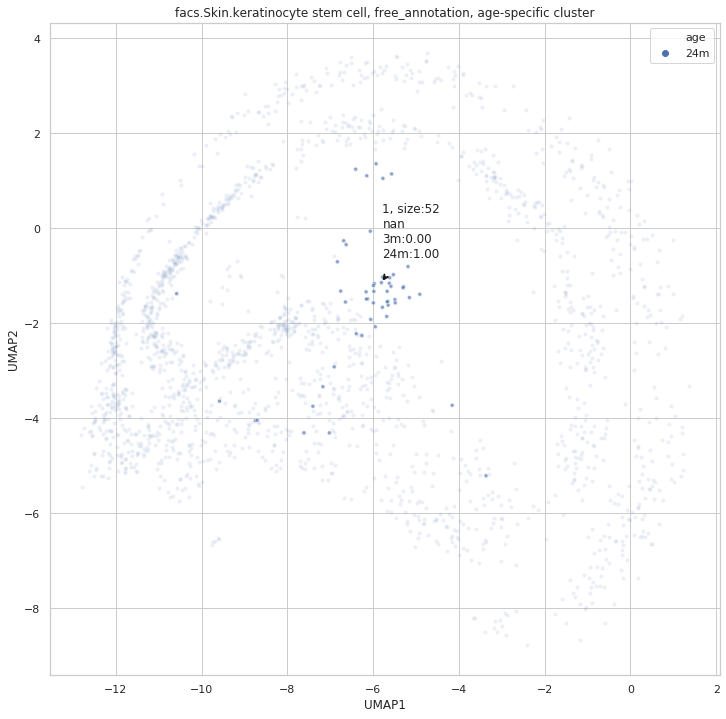

In [84]:
# Visualizing for all cases
ref_list = ['cell_ontology_class', 'subtissue', 'free_annotation']
age_yo_list = ['young', 'old']
for analyte in dic_data_intersting_case.keys():
    print(analyte)
    temp_adata = dic_data_intersting_case[analyte]
    # selecting the cell type to visualize
    if len(analyte.split('.'))==3:
        method,tissue,cell_type = analyte.split('.')
        temp_adata = temp_adata[temp_adata.obs['cell_ontology_class']==cell_type]
    # A sorted age list
    age_list = [int(x[:-1])for x in set(temp_adata.obs['age'])]
    age_list.sort()
    age_list = ['%dm'%x for x in age_list]
    for ref in ref_list:
        temp_adata.obs[ref] = [str(x) for x in temp_adata.obs[ref]]
    df_cluster_annotation = mh.parse_cluster_result(temp_adata, ref_list = ref_list)
    temp_adata.obs['age_yo'] = ['young' if x in ['1m', '3m'] else 'old'
                                    for x in temp_adata.obs['age']]
    # UMAP for plotting
    df_UMAP = temp_adata.obs[['age', 'age_yo', 'leiden', 'cell_ontology_class']].copy()
    df_UMAP['leiden_str'] = ['c%s'%x for x in df_UMAP['leiden']]
    df_UMAP['UMAP1'] = temp_adata.obsm['X_umap'][:,0]
    df_UMAP['UMAP2'] = temp_adata.obsm['X_umap'][:,1]
    # Common and age specific clusters
    temp_df = df_cluster_annotation[['%s.prop'%x for x in age_yo_list]]
    common_cluster = (np.sum(temp_df<0.25, axis=1)==0) & \
                        (df_cluster_annotation['cluster_size']>50)
    specific_cluster = (np.sum(temp_df<0.25, axis=1)>0) & \
                        (df_cluster_annotation['cluster_size']>50)
    common_cluster_list = list(df_cluster_annotation.index[common_cluster])
    specific_cluster_list = list(df_cluster_annotation.index[specific_cluster])
    # Plot the figure
    for ref in ref_list:
        if '%s.nan.prop'%ref not in df_cluster_annotation.columns:
            continue
        # plot for common clusters
        temp_df = df_UMAP.loc[df_UMAP['leiden'].isin(common_cluster_list)].copy()
        temp_df['c.leiden'] = ['c.%s'%x for x in temp_df['leiden']]
        plt.figure(figsize=[12,12])
        if df_UMAP.shape[0] > 3000: 
            alpha_=0.05
        else:
            alpha_=0.1
        sns.scatterplot(x='UMAP1', y='UMAP2', data=df_UMAP, s=16, alpha=alpha_, legend=False)
        sns.scatterplot(x='UMAP1', y='UMAP2', data=temp_df, hue='age', s=16, alpha=0.6)
        # add cluster information
        texts = []
        for cluster_label in common_cluster_list:
            temp_ = temp_df.loc[temp_df['leiden']==cluster_label]
            label_str = '%s, size:%d\n%s\n'%(cluster_label, 
                                             df_cluster_annotation.loc[cluster_label,'cluster_size'],
                                             df_cluster_annotation.loc[cluster_label,'%s.name'%ref])
#             for age in age_yo_list:
            for age in age_list:
                label_str += '%s:%0.2f\n'%(age, df_cluster_annotation.loc[cluster_label,'%s.prop'%age])
            texts.append(plt.text(temp_['UMAP1'][0], temp_['UMAP2'][0],
                                  label_str, fontsize=10))
        adjust_text(texts, arrowprops=dict(arrowstyle="->", color='k', lw=2))
        plt.title('%s, %s, common cluster'%(analyte, ref))
        plt.show()
        # plot for specific clusters
        temp_df = df_UMAP.loc[df_UMAP['leiden'].isin(specific_cluster_list)].copy()
        temp_df['c.leiden'] = ['c.%s'%x for x in temp_df['leiden']]
        plt.figure(figsize=[12,12])
        sns.scatterplot(x='UMAP1', y='UMAP2', data=df_UMAP, s=16, alpha=alpha_, legend=False)
        # sns.scatterplot(x='UMAP1', y='UMAP2', data=temp_df, hue='c.leiden', s=16, alpha=0.8)
        sns.scatterplot(x='UMAP1', y='UMAP2', data=temp_df, hue='age', s=16, alpha=0.6)
        # add cluster information
        texts = []
        for cluster_label in specific_cluster_list:
            temp_ = temp_df.loc[temp_df['leiden']==cluster_label]
            label_str = '%s, size:%d\n%s\n'%(cluster_label, 
                                             df_cluster_annotation.loc[cluster_label,'cluster_size'],
                                             df_cluster_annotation.loc[cluster_label,'%s.name'%ref])
#             for age in age_yo_list:
            for age in age_list:
                label_str += '%s:%0.2f\n'%(age, df_cluster_annotation.loc[cluster_label,'%s.prop'%age])
            texts.append(plt.text(temp_['UMAP1'][0], temp_['UMAP2'][0],
                                  label_str, fontsize=12))
        adjust_text(texts, arrowprops=dict(arrowstyle="->", color='k', lw=2))
        plt.title('%s, %s, age-specific cluster'%(analyte, ref))
        plt.show()

### facs.Brain_Myeloid

In [145]:
df_cluster_annotation

,cluster_size,3m.ct,18m.ct,24m.ct,3m.prop,18m.prop,24m.prop,young.ct,old.ct,young.prop,old.prop,free_annotation.nan.prop,free_annotation.top.name,free_annotation.top.prop,free_annotation.second.name,free_annotation.second.prop,free_annotation.third.name,free_annotation.third.prop,free_annotation.name
0,2711,1059,1306,346,0.388206,0.486370,0.125424,1059,1652,0.561260,0.438740,0.481741,young female microglia,0.676157,microglia,0.209253,young male microglia,0.110320,young female microglia 0.68/\nmicroglia 0.21/\...
1,2464,1945,228,291,0.789242,0.093990,0.116768,1945,519,0.882057,0.117943,0.092532,young male microglia,0.845259,microglia,0.127460,young female microglia,0.018784,young male microglia 0.85/\nmicroglia 0.13
2,1790,61,453,1276,0.034212,0.258108,0.707680,61,1729,0.065774,0.934226,0.254749,old microglia,0.822339,microglia,0.149175,young male microglia,0.011244,old microglia 0.82/\nmicroglia 0.15
3,1479,92,1026,361,0.061691,0.698934,0.239375,92,1387,0.116895,0.883105,0.693712,old microglia,0.313466,interferon-gamma producing microglia,0.306843,microglia,0.222958,nan
4,1357,203,400,754,0.149818,0.299907,0.550275,203,1154,0.259831,0.740169,0.294768,microglia,0.684431,young female microglia,0.194357,old microglia,0.096134,microglia 0.68/\nyoung female microglia 0.19/\...
5,1330,91,538,701,0.068382,0.410714,0.520904,91,1239,0.127832,0.872168,0.404511,microglia,0.646465,old microglia,0.231061,young female microglia,0.090909,microglia 0.65/\nold microglia 0.23/\nyoung fe...
6,1004,928,56,20,0.923688,0.056627,0.019686,928,76,0.960579,0.039421,0.055777,young female microglia,0.957806,microglia,0.022152,old microglia,0.015823,young female microglia 0.96
7,438,61,220,157,0.138714,0.508242,0.353045,61,377,0.244081,0.755919,0.502283,old microglia,0.711009,young female microglia,0.165138,young male microglia,0.059633,old microglia 0.71/\nyoung female microglia 0....
8,204,36,68,100,0.176497,0.338689,0.484814,36,168,0.299536,0.700464,0.990196,old microglia,0.500000,interferon-gamma producing microglia,0.500000,young male microglia,0.000000,nan
9,187,8,45,134,0.042959,0.245489,0.711552,8,179,0.081885,0.918115,0.759358,microglia,0.600000,young male microglia,0.155556,old microglia,0.088889,nan


In [115]:
specific_cluster_list

['1', '2', '3', '5', '6', '7', '9', '10', '11', '12', '13', '14']

facs.Brain_Myeloid


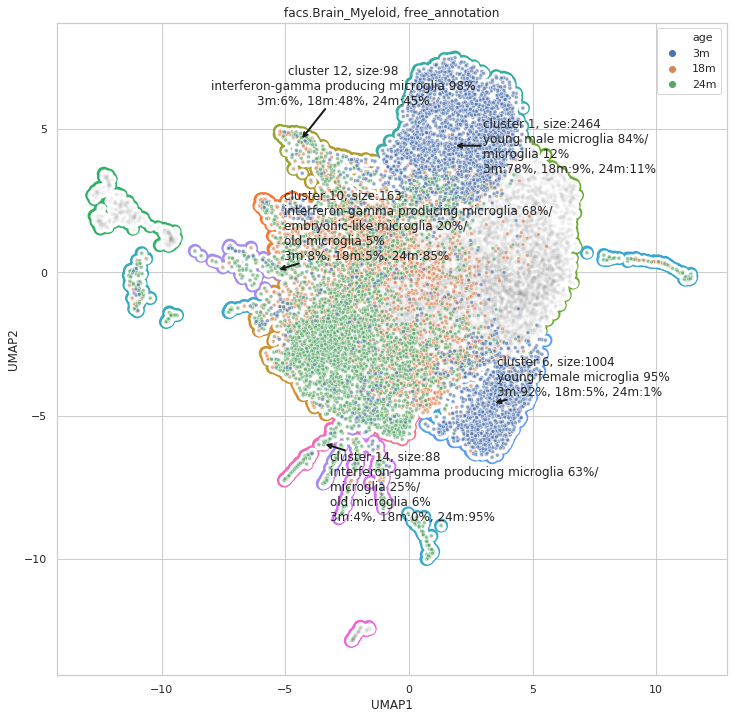

In [165]:
# Visualizing for all cases
age_yo_list = ['young', 'old']
ref_list = ['free_annotation']
for analyte in ['facs.Brain_Myeloid']:
    print(analyte)
    temp_adata = dic_data_intersting_case[analyte]
    # selecting the cell type to visualize
    if len(analyte.split('.'))==3:
        method,tissue,cell_type = analyte.split('.')
        temp_adata = temp_adata[temp_adata.obs['cell_ontology_class']==cell_type]
    # A sorted age list
    age_list = [int(x[:-1])for x in set(temp_adata.obs['age'])]
    age_list.sort()
    age_list = ['%dm'%x for x in age_list]
    for ref in ref_list:
        temp_adata.obs[ref] = [str(x) for x in temp_adata.obs[ref]]
    df_cluster_annotation = mh.parse_cluster_result(temp_adata, ref_list = ref_list)
    temp_adata.obs['age_yo'] = ['young' if x in ['1m', '3m'] else 'old'
                                for x in temp_adata.obs['age']]
    # UMAP for plotting
    df_UMAP = temp_adata.obs[['age', 'age_yo', 'leiden', 'cell_ontology_class']].copy()
    df_UMAP['leiden_str'] = ['c%s'%x for x in df_UMAP['leiden']]
    df_UMAP['UMAP1'] = temp_adata.obsm['X_umap'][:,0]
    df_UMAP['UMAP2'] = temp_adata.obsm['X_umap'][:,1]
    # Common and age specific clusters
    temp_df = df_cluster_annotation[['%s.prop'%x for x in age_yo_list]]
    common_cluster = (np.sum(temp_df<0.25, axis=1)==0) & \
                        (df_cluster_annotation['cluster_size']>50)
    specific_cluster = (np.sum(temp_df<0.25, axis=1)>0) & \
                        (df_cluster_annotation['cluster_size']>50)
    common_cluster_list = list(df_cluster_annotation.index[common_cluster])
    specific_cluster_list = list(df_cluster_annotation.index[specific_cluster])
    # Plot the figure
    for ref in ref_list:
        if '%s.nan.prop'%ref not in df_cluster_annotation.columns:
            continue
        # plot for specific clusters
        temp_df = df_UMAP.loc[df_UMAP['leiden'].isin(specific_cluster_list)].copy()
        temp_df['c.leiden'] = ['c.%s'%x for x in temp_df['leiden']]
        # plot for annotation clusters
        annotation_cluster_list = ['1', '6', '10', '12', '14']
        temp_df_anno = df_UMAP.loc[df_UMAP['leiden'].isin(annotation_cluster_list)].copy()
        temp_df_anno['c.leiden'] = ['c.%s'%x for x in temp_df_anno['leiden']]
        plt.figure(figsize=[12,12])
        # Add cluster boundry
        sns.scatterplot(x='UMAP1', y='UMAP2', data=df_UMAP, s=200, alpha=1,
                        hue = 'leiden_str', legend=False, linewidth=0)
        sns.scatterplot(x='UMAP1', y='UMAP2', data=df_UMAP, s=100, alpha=1, 
                        legend=False, color='w', linewidth=0)
#         # background points
        sns.scatterplot(x='UMAP1', y='UMAP2', data=df_UMAP, s=16, alpha=0.05, legend=False,
                        color='k')
        # tissue specific points
        sns.scatterplot(x='UMAP1', y='UMAP2', data=temp_df, hue='age',
                        hue_order=['3m', '18m', '24m'], s=16, alpha=0.6)
        # add cluster information
        texts = []
        for cluster_label in annotation_cluster_list:
            temp_ = temp_df.loc[temp_df['leiden']==cluster_label]
            label_str = 'cluster %s, size:%d\n%s\n'%(cluster_label, 
                                                     df_cluster_annotation.loc[cluster_label,'cluster_size'],
                                                     df_cluster_annotation.loc[cluster_label,'%s.name'%ref])
            for age in age_list:
                label_str += '%s:%d%%, '\
                    %(age, 100*df_cluster_annotation.loc[cluster_label,'%s.prop'%age])
            label_str = label_str[:-2]
            texts.append(plt.text(temp_['UMAP1'].median(), temp_['UMAP2'].median(),
                                  label_str, fontsize=12))
        adjust_text(texts, arrowprops=dict(arrowstyle="->", color='k', lw=2))
        plt.title('%s, %s'%(analyte, ref))
        plt.savefig(output_folder + '/case_%s.pdf'%analyte)
        plt.show()

### droplet.Kidney.macrophage

Trying to set attribute `.obs` of view, making a copy.


droplet.Kidney.macrophage


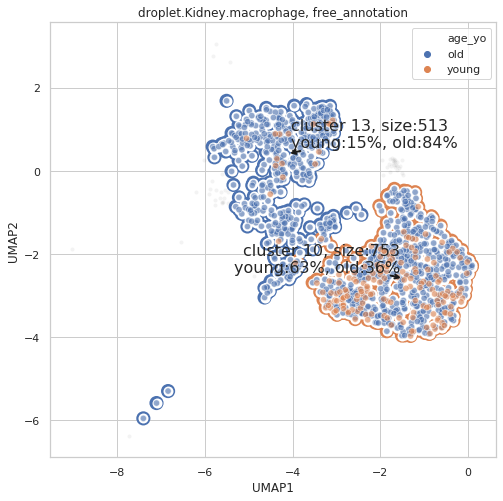

In [180]:
ref_list = ['free_annotation']
for analyte in ['droplet.Kidney.macrophage']:
    print(analyte)
    temp_adata = dic_data_intersting_case[analyte]
    # selecting the cell type to visualize
    if len(analyte.split('.'))==3:
        method,tissue,cell_type = analyte.split('.')
        temp_adata = temp_adata[temp_adata.obs['cell_ontology_class']==cell_type]
    # A sorted age list
    age_list = [int(x[:-1])for x in set(temp_adata.obs['age'])]
    age_list.sort()
    age_list = ['%dm'%x for x in age_list]
    for ref in ref_list:
        temp_adata.obs[ref] = [str(x) for x in temp_adata.obs[ref]]
    df_cluster_annotation = mh.parse_cluster_result(temp_adata, ref_list = ref_list)
    temp_adata.obs['age_yo'] = ['young' if x in ['1m', '3m'] else 'old'
                                    for x in temp_adata.obs['age']]
    # UMAP for plotting
    df_UMAP = temp_adata.obs[['age', 'age_yo', 'leiden', 'cell_ontology_class']].copy()
    df_UMAP['leiden_str'] = ['c%s'%x for x in df_UMAP['leiden']]
    df_UMAP['UMAP1'] = temp_adata.obsm['X_umap'][:,0]
    df_UMAP['UMAP2'] = temp_adata.obsm['X_umap'][:,1]
    # Common and age specific clusters
    temp_df = df_cluster_annotation[['%s.prop'%x for x in age_yo_list]]
    common_cluster = (np.sum(temp_df<0, axis=1)==0) & \
                        (df_cluster_annotation['cluster_size']>50)
    specific_cluster = (np.sum(temp_df<0.25, axis=1)>0) & \
                        (df_cluster_annotation['cluster_size']>50)
    common_cluster_list = list(df_cluster_annotation.index[common_cluster])
    specific_cluster_list = list(df_cluster_annotation.index[specific_cluster])
    # Plot the figure
    for ref in ref_list:
        if '%s.nan.prop'%ref not in df_cluster_annotation.columns:
            continue
        # plot for common clusters
        temp_df = df_UMAP.loc[df_UMAP['leiden'].isin(common_cluster_list)].copy()
        temp_df['c.leiden'] = ['c.%s'%x for x in temp_df['leiden']]
        plt.figure(figsize=[8,8])
        if df_UMAP.shape[0] > 3000: 
            alpha_=0.05
        else:
            alpha_=0.1
        # Add cluster boundry
        sns.scatterplot(x='UMAP1', y='UMAP2', data=temp_df, s=200, alpha=1,
                        hue = 'leiden_str', legend=False, linewidth=0)
        sns.scatterplot(x='UMAP1', y='UMAP2', data=temp_df, s=100, alpha=1, 
                        legend=False, color='w', linewidth=0)
        sns.scatterplot(x='UMAP1', y='UMAP2', data=df_UMAP, s=16, alpha=0.05, legend=False,
                        color='k')
        sns.scatterplot(x='UMAP1', y='UMAP2', data=temp_df, hue='age_yo', s=40, alpha=0.6)
        # add cluster information
        texts = []
        for cluster_label in common_cluster_list:
            temp_ = temp_df.loc[temp_df['leiden']==cluster_label]
            label_str = 'cluster %s, size:%d\n'%(cluster_label, 
                                             df_cluster_annotation.loc[cluster_label,'cluster_size'])
#             for age in age_yo_list:
            for age in age_yo_list:
                label_str += '%s:%d%%, '\
                    %(age, 100*df_cluster_annotation.loc[cluster_label,'%s.prop'%age])
            label_str = label_str[:-2]
#             for age in age_yo_list:
#                 label_str += '%s:%0.2f\n'%(age, df_cluster_annotation.loc[cluster_label,'%s.prop'%age])
            texts.append(plt.text(temp_['UMAP1'].median(), temp_['UMAP2'].median(),
                                  label_str, fontsize=16))
        adjust_text(texts, arrowprops=dict(arrowstyle="->", color='k', lw=2))
        plt.title('%s, %s'%(analyte, ref))
        plt.savefig(output_folder + '/case_%s.pdf'%analyte)
        plt.show()

In [175]:
output_folder

'/home/martin/maca/maca-data-analysis/results/fig_cluster'

/home/martin/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/home/martin/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/home/martin/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1831: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


saving figure to file ./figures/rank_genes_groups_leidencase_droplet.Kidney.macrophage_rank_genes_10vs13.pdf


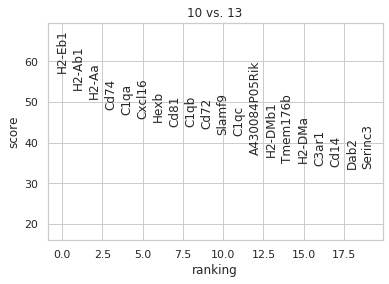

saving figure to file ./figures/rank_genes_groups_leidencase_droplet.Kidney.macrophage_rank_genes_13vs10.pdf


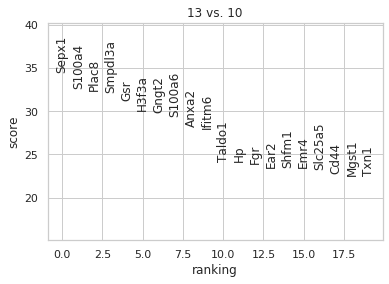

In [176]:
sc.tl.rank_genes_groups(temp_adata, groupby='leiden', groups=['13'], reference='10',
                        key_added='rank_genes_13vs10')
sc.tl.rank_genes_groups(temp_adata, groupby='leiden', groups=['10'], reference='13',
                        key_added='rank_genes_10vs13')
sc.pl.rank_genes_groups(temp_adata, key='rank_genes_10vs13', fontsize=12,
                        save = 'case_%s_rank_genes_10vs13.pdf'%analyte)
sc.pl.rank_genes_groups(temp_adata, key='rank_genes_13vs10', fontsize=12,
                        save = 'case_%s_rank_genes_13vs10.pdf'%analyte)

### facs.Marrow.granulocyte

Trying to set attribute `.obs` of view, making a copy.


facs.Marrow.granulocyte


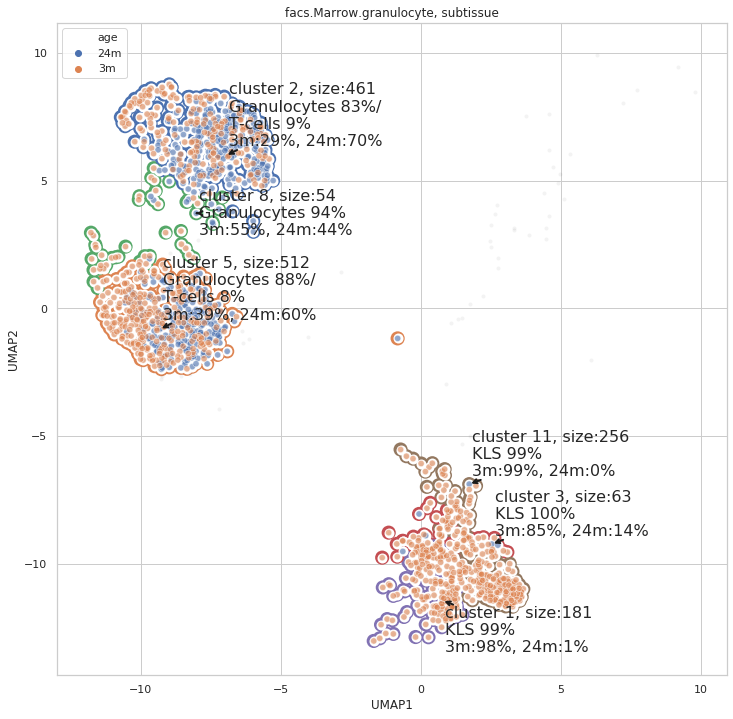

In [183]:
ref_list = ['subtissue']
for analyte in ['facs.Marrow.granulocyte']:
    print(analyte)
    temp_adata = dic_data_intersting_case[analyte]
    # selecting the cell type to visualize
    if len(analyte.split('.'))==3:
        method,tissue,cell_type = analyte.split('.')
        temp_adata = temp_adata[temp_adata.obs['cell_ontology_class']==cell_type]
    # A sorted age list
    age_list = [int(x[:-1])for x in set(temp_adata.obs['age'])]
    age_list.sort()
    age_list = ['%dm'%x for x in age_list]
    for ref in ref_list:
        temp_adata.obs[ref] = [str(x) for x in temp_adata.obs[ref]]
    df_cluster_annotation = mh.parse_cluster_result(temp_adata, ref_list = ref_list)
    temp_adata.obs['age_yo'] = ['young' if x in ['1m', '3m'] else 'old'
                                    for x in temp_adata.obs['age']]
    # UMAP for plotting
    df_UMAP = temp_adata.obs[['age', 'age_yo', 'leiden', 'cell_ontology_class']].copy()
    df_UMAP['leiden_str'] = ['c%s'%x for x in df_UMAP['leiden']]
    df_UMAP['UMAP1'] = temp_adata.obsm['X_umap'][:,0]
    df_UMAP['UMAP2'] = temp_adata.obsm['X_umap'][:,1]
    # Common and age specific clusters
    temp_df = df_cluster_annotation[['%s.prop'%x for x in age_yo_list]]
    common_cluster = (np.sum(temp_df<0, axis=1)==0) & \
                        (df_cluster_annotation['cluster_size']>50)
    specific_cluster = (np.sum(temp_df<0.25, axis=1)>0) & \
                        (df_cluster_annotation['cluster_size']>50)
    common_cluster_list = list(df_cluster_annotation.index[common_cluster])
    specific_cluster_list = list(df_cluster_annotation.index[specific_cluster])
    # Plot the figure
    for ref in ref_list:
        if '%s.nan.prop'%ref not in df_cluster_annotation.columns:
            continue
        # plot for common clusters
        temp_df = df_UMAP.loc[df_UMAP['leiden'].isin(common_cluster_list)].copy()
        temp_df['c.leiden'] = ['c.%s'%x for x in temp_df['leiden']]
        plt.figure(figsize=[12,12])
        # Add cluster boundry
        sns.scatterplot(x='UMAP1', y='UMAP2', data=temp_df, s=200, alpha=1,
                        hue = 'leiden_str', legend=False, linewidth=0)
        sns.scatterplot(x='UMAP1', y='UMAP2', data=temp_df, s=100, alpha=1, 
                        legend=False, color='w', linewidth=0)
        sns.scatterplot(x='UMAP1', y='UMAP2', data=df_UMAP, s=16, alpha=0.05, legend=False,
                        color='k')
#         sns.scatterplot(x='UMAP1', y='UMAP2', data=df_UMAP, s=16, alpha=alpha_, legend=False)
        # sns.scatterplot(x='UMAP1', y='UMAP2', data=temp_df, hue='c.leiden', s=16, alpha=0.6)
        sns.scatterplot(x='UMAP1', y='UMAP2', data=temp_df, hue='age', s=40, alpha=0.6)
        # add cluster information
        texts = []
        for cluster_label in common_cluster_list:
            temp_ = temp_df.loc[temp_df['leiden']==cluster_label]
            label_str = 'cluster %s, size:%d\n%s\n'%(cluster_label, 
                                             df_cluster_annotation.loc[cluster_label,'cluster_size'],
                                             df_cluster_annotation.loc[cluster_label,'%s.name'%ref])
#             for age in age_yo_list:
            for age in age_list:
                label_str += '%s:%d%%, '\
                    %(age, 100*df_cluster_annotation.loc[cluster_label,'%s.prop'%age])
            label_str = label_str[:-2]
            texts.append(plt.text(temp_['UMAP1'][0], temp_['UMAP2'][0],
                                  label_str, fontsize=16))
        adjust_text(texts, arrowprops=dict(arrowstyle="->", color='k', lw=2))
        plt.title('%s, %s'%(analyte, ref))
        plt.savefig(output_folder + '/case_%s.pdf'%analyte)
        plt.show()